# 선형회귀<sup>Linear Regression</sup>

- 주요 참고 문헌 :  Pattern Recognition and Machine Learning, Christopher Bishop, Springer<sup>[Bishop]</sup>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D

# matplotlib style
style_name = 'bmh' #bmh
mpl.style.use(style_name)
style = plt.style.library[style_name]
style_colors = [ c['color'] for c in style['axes.prop_cycle'] ]

# matplotlib 한글출력
# plt.rcParams['font.family'] = 'NanumBarunGothic'
# mpl.rc('font', family='NanumBarunGothic')
# plt.rcParams['axes.unicode_minus'] = False

np.set_printoptions(precision=4, linewidth =150)

##########################################################
# for sklearn
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

##########################################################
# for plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
from IPython.core.display import display, HTML

init_notebook_mode(connected=True)

# https://github.com/plotly/plotly.py/issues/515
# The polling here is to ensure that plotly.js has already been loaded before
# setting display alignment in order to avoid a race condition.
display(HTML(
    '<script>'
        'var waitForPlotly = setInterval( function() {'
            'if( typeof(window.Plotly) !== "undefined" ){'
                'MathJax.Hub.Config({ SVG: { font: "STIX-Web" }, displayAlign: "center" });'
                'MathJax.Hub.Queue(["setRenderer", MathJax.Hub, "SVG"]);'
                'clearInterval(waitForPlotly);'
            '}}, 250 );'
    '</script>'
))

In [2]:
# 3주차에 만든 최적화 함수를 정의한 노트북 파일을 로드한다.
%run ../class-03/minimize.ipynb

## 목표

- 주어진 데이터를 대표하는 곡선을 찾기 위해 최소제곱법을 구성한다.

- 구성된 최소제곱법을 풀어내기 위해 경사하강법의 두 종류 최속강하법<sup>steepest descent method</sup>와 공액경사도법<sup>conjugate gradient method</sup>를 적용한다.

- 모델의 복잡도가 문제를 변화시키는 양상과 규제화<sup>regularization</sup>의 메커니즘을 이해한다.

- 볼록계획<sup>convex programming problem</sup>문제인 선형회귀를 해석적으로 풀기 위한 과정인 정규방정식을 이해한다.


## 데이터 생성

- 데이터 생성을 위한 곡선 : $\sin(2\pi x)$

- $\boldsymbol{\mathsf{x}}_{\text{train}} = (x_1, x_2, \dots, x_N)^{\text{T}}$ : [0,1]구간을 등간격 잘라 만든 $x$ 값 입력 데이터, $N=10$

- $\boldsymbol{\mathsf{t}}_{\text{train}} = (t_1, t_2, \dots, t_N)^{\text{T}}$ : $\sin(2\pi\boldsymbol{\mathsf{x}})+\text{noise}$로 만들어진 출력 데이터

- 같은 방식으로 학습데이터<sup>train data</sup>, 테스트 데이터<sup>test data</sup>를 각각 따로 준비

- 학습데이터 : 선형 회귀 모델을 학습하는데 사용하는 데이터

- 테스트데이터 : 학습이 끝난 선형 회귀 모델을 평가하기 위해 사용하는 데이터

#### 기호법

- $D$ : 입력 데이터의 차원

- $\mathbf{x}$ : 입력 데이터, 일반적으로 $D$차원, $D \times 1$ 열벡터, $x$로 쓰면 스칼라

- $N$ : 데이터의 개수

- $\mathbf{X}$ : $N$개의 입력 데이터 $\mathbf{x}$의 집합, 따라서 $N \times D$ 행렬, 즉 데이터 $\mathbf{x}$가 행벡터

- $t$ : 입력에 대응되는 출력, 스칼라

- $\boldsymbol{\mathsf{t}}$ : 스칼라 $t$의 집합으로 $N \times 1$ 열벡터

- $\mathbf{w}$ : 회귀계수, 기저함수를 쓴다면 $M \times 1$ 열벡터, 쓰지 않으면 $D \times 1$ 열벡터

x_train:(10,)
t_train:(10,)


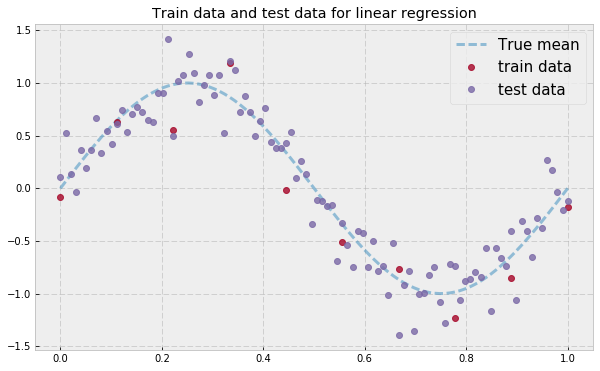

In [3]:
######################################################
# 회귀에 사용할 데이터를 준비
# 학습데이터와 테스트 데이트를 모두 준비
######################################################

plt.rcParams["figure.figsize"] = (10,6)

# 시드를 심어 항상 같은 결과가 나오게 한다.
np.random.seed(2)

# x범위는 0~1까지
x = np.linspace(0, 1, 100)
# 데이터가 생성되는 기준이 되는 함수
t = np.sin(2*np.pi*x)

N = 10
x_train = np.linspace(0, 1, N)
t_train = np.sin(2*np.pi*x_train) + (np.random.randn(N)/5)
print("x_train:{}".format(x_train.shape))
print("t_train:{}".format(t_train.shape))

N_test = 100
x_test = np.linspace(0, 1, N_test)
t_test = np.sin(2*np.pi*x_test) + (np.random.randn(N_test)/5)

plt.plot(x, t, '--', lw=3, alpha=0.5, label="True mean")
plt.plot(x_train, t_train, 'o', alpha=0.8, label="train data")
plt.plot(x_test, t_test, 'o', alpha=0.8, label="test data")
plt.title("Train data and test data for linear regression")
plt.legend(fontsize=15)
plt.show()

## 선형모델<sup>linear model</sup>

- 준비한 데이터 중 학습데이터를 잘 표현하는 직선을 찾고 싶다면 다음과 같은 직선을 생각해볼 수 있다.

$$
y = w_0 + w_1 x
$$

- 현재 문제에서 입력 $x$는 스칼라(숫자 하나), 결정해야하는 파라미터 $w_0$, $w_1$ 두개 

- 위 식에서 $w_0$뒤에 숫자 1이 곱해져있다고 생각해보면

$$
y = w_0 \times 1 + w_1 \times x
$$

- 위 식을 벡터 형식으로 써보면

$$
y = w_0 \times 1 + w_1 \times x =  (w_0, w_1) \cdot \begin{pmatrix} 1 \\ x\end{pmatrix}= \mathbf{w}^{\text{T}} \mathbf{x}
$$

- 단 이때 $\mathbf{x}$는 첫번째 요소에 항상 1이 오는 요소 개수 2인 벡터

원래 x_train
[0.     0.1111 0.2222 0.3333 0.4444 0.5556 0.6667 0.7778 0.8889 1.    ]


첫 요소에 1을 추가하여 각각을 벡터로 만든 x_train : X
(10, 2)
[[1.     0.    ]
 [1.     0.1111]
 [1.     0.2222]
 [1.     0.3333]
 [1.     0.4444]
 [1.     0.5556]
 [1.     0.6667]
 [1.     0.7778]
 [1.     0.8889]
 [1.     1.    ]]


w와 X의 내적
[[ 1.    ]
 [ 0.7778]
 [ 0.5556]
 [ 0.3333]
 [ 0.1111]
 [-0.1111]
 [-0.3333]
 [-0.5556]
 [-0.7778]
 [-1.    ]]


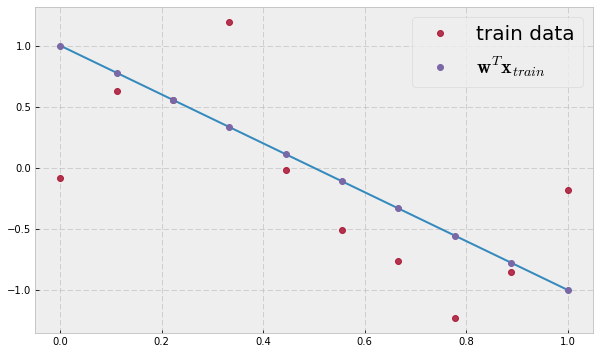

In [4]:
# x_train은 숫자 1개인 입력데이터 10개가 있는 1차원 데이터
print("원래 x_train")
print(x_train)
print('\n')

# 결정해야하는 두개의 w
w0 = 1.0
w1 = -2.
w = np.array([w0, w1])

# 첫번째 요소에 1을 추가하고
X = np.array([np.ones_like(x_train), x_train]).T
print("첫 요소에 1을 추가하여 각각을 벡터로 만든 x_train : X")
print(X.shape)
print(X)
print('\n')

#w와 내적을 하면 결과값 10개가 만들어 진다. w^t X
print("w와 X의 내적")
print(np.dot(X,w.reshape(-1,1)))

plt.rcParams["figure.figsize"] = (10,6)

plt.plot(x, x*w[1]+w[0])
plt.plot(x_train, t_train, 'o', alpha=0.8, label="train data")
plt.plot(x_train, np.dot(X,w.reshape(-1,1)), 'o', label=r"$\mathbf{w}^T \mathbf{x}_{train}$")
plt.legend(fontsize=20)
plt.show()

### 다항식 기저

- 직선으로 데이터를 잘 표현할 수 있을것 같지 않다.

- 다음과 같은 곡선을 생각

$$
y(x, \mathbf{w}) = w_0 x^0 + w_1 x^1 + w_2 x^2 + \cdots + w_M x^M = \sum_{j=0}^{M} w_j x^j
$$

- $M=1$이면 앞서 이야기한 직선과 동일

- 위 다항식은 $x$에 대해서 비선형, $w$에 대해서 선형($w$에 대해서 제곱이상의 항이 없음) $\to$ 선형모델

- 위 다항식이 $\sin(2\pi x)$와 비슷하기를 원함.

- 다르게 말하면 데이터를 발생시킨 곡선이 위 다항식과 비슷하지 않았을까? 하고 가정하는 것

- 따라서 가끔 위 다항식을 가설<sup>hypothesis</sup>로 부르기도 함. 즉 우리의 가설이 잘 맞기를 바라는 것

- 머신러닝의 특성<sup>feature</sup>관점에서 보면 주어진 데이터는 $x$인데 여기에 $x^0$, $x^2$, ... , $x^M$ 이라는 새로운 숫자들을 추가한 것이므로 회귀에 필요한 특성을 더 추가 해준것으로 보기도 함

- 예를들어 주어진 데이터 $\mathcal{D}= (x, t)$이 주택 가격에 관련된 데이터인데 여기서 $x$는 주택의 너비를 의미하고 $t$는 주택의 가격이라면 $x$가 크면 클 수록 $t$가 커지는 관계를 가질 것이라 예상 가능

- 이 경우 $x^2$은 주택의 면적, $x^3$은 주택 공간의 부피로 주택에 대한 특성이라고 볼 수 있음

- 항상 물리적 의미를 부여할 수 있는 것은 아님

- 가설이 꼭 다항식일 필요는 없음.

- $y(x,\mathbf{w})$를 구체적인 $D$차원 벡터에 대한 기저함수 형식으로 쓰면 

$$
y(\mathbf{x},\mathbf{w}) = 
\begin{bmatrix}
w_0 & w_1 & w_2 & \cdots & w_M
\end{bmatrix}
\begin{bmatrix}
x^0 \\ x^1 \\ x^2 \\ \vdots \\ x^M
\end{bmatrix} =
\mathbf{w}^{\text{T}} \boldsymbol{\phi}(x)
$$

- 우리가 결정해야할 사항 

    - 항은 몇개까지 설정할까? $M$= ? $\to$ $M$ 선택으로 모델 복잡도를 결정

    - $M+1$개의 $w$들은 어떻게 설정할까?

- 그냥 마음대로... $M=3$, $w_0 = -2$, $w_1 = 1.5$, $w_2 = 0.3$, $w_3 = 3$

$$
y(x, \mathbf{w}) = -2 + 1.5x + 0.3x^2 + 3 x^3
$$

- 아래 결과처럼 하나도 안맞음.

w : -2, 1.5, 0.3, 3


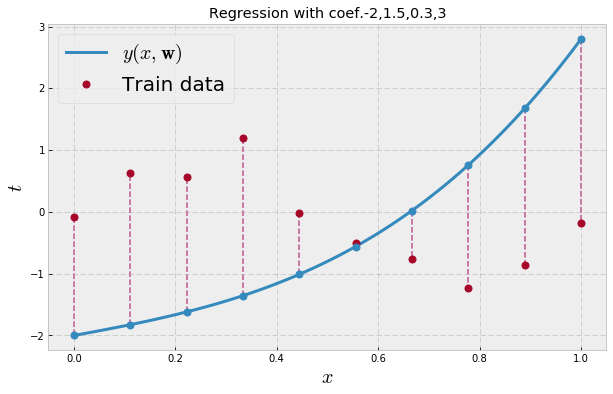

In [5]:
plt.rcParams["figure.figsize"] = (10,6)

y = -2 + 1.5*x + 0.3*x**2 + 3*x**3
y_pred = -2 + 1.5*x_train + 0.3*x_train**2 + 3*x_train**3

print("w : {}, {}, {}, {}".format(-2, 1.5, 0.3, 3))

plt.plot([x_train, x_train],[y_pred, t_train], '--', color=style_colors[5], lw=2)
plt.plot(x, y, label="$y(x,\mathbf{w})$", lw=3)
plt.plot(x_train, t_train, 'o',  markersize=7 , label=r'Train data')
plt.plot(x_train, y_pred, 'o',  markersize=7, color=style_colors[0])
plt.xlabel('$x$', fontsize=20)
plt.ylabel('$t$', fontsize=20)
plt.title('Regression with coef.{},{},{},{}'.format(-2, 1.5, 0.3, 3))
plt.legend(fontsize=20)

plt.show()

### numpy, sklearn을 이용한 선형회귀

- 두 라이브러리로 선형회귀를 수행하여 결과를 비교

- numpy에 최소제곱을 수행하는 간단한 polyfit함수 제공

- sklearn에도 제공

- 두 결과는 동일 : 수학적으로 같은 알고리즘

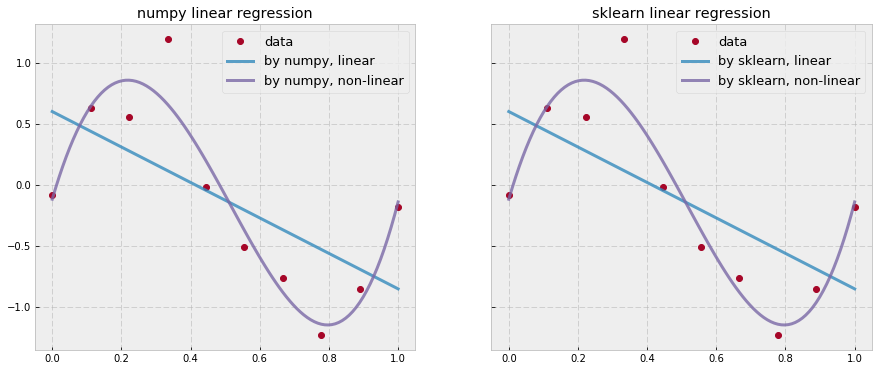

numpy coef.   : [  3.2748  14.1305 -27.1019   9.6745], Bias:-0.1181
sklearn coef. : [  3.2748  14.1305 -27.1019   9.6745], Bias:-0.1181


In [6]:
######################################################
# 본격적으로 회귀를 하기 전에 기존 라이브러리를 이용하여 
# 결과를 만들고 우리 알고리즘의 결과와 비교해보자.
######################################################
plt.rcParams["figure.figsize"] = (17,7)

# M차 다항식
# w가 5차원 벡터, 각 4차 계수, 각 3차 계수, 2차 계수, 1차 계수, 0차 계수(상수) 
M = 4

#########################################################################
## 넘파이 라이브러리를 사용해서 간단하게 구할 수 있다.
#########################################################################
# 1차 다항식
z_lin    = np.polyfit(x_train, t_train, 1) 

# M차 다항식
z_nonlin = np.polyfit(x_train, t_train, M)

y_lin    = np.poly1d(z_lin)
y_nonlin = np.poly1d(z_nonlin)
#########################################################################

#########################################################################
## sklearn 라이브러리를 사용해서 간단(?)하게 구할 수 있다.
#########################################################################
# 1차 다항식
model = LinearRegression(fit_intercept=True)
model.fit(x_train[:, np.newaxis], t_train)
y_sk_lin = model.predict(x[:, np.newaxis])

# M차 다항식
poly_model = make_pipeline(PolynomialFeatures(M), LinearRegression())
poly_model.fit(x_train[:, np.newaxis], t_train)
y_sk_nonlin = poly_model.predict(x[:, np.newaxis])

plt.rcParams["figure.figsize"] = (15,6)
f, (ax1, ax2) = plt.subplots(1, 2, sharex=True, sharey=True)

ax1.plot(x_train, t_train, 'o', color=style_colors[1], label=r"data")
ax1.plot(x, y_lin(x), linewidth=3, alpha=0.8, color=style_colors[0], label=r"by numpy, linear")
ax1.plot(x, y_nonlin(x), linewidth=3, alpha=0.8, color=style_colors[2], label=r"by numpy, non-linear")
ax1.legend(fontsize=13)
ax1.set_title('numpy linear regression')

ax2.plot(x_train, t_train, 'o', color=style_colors[1], label=r"data")
ax2.plot(x, y_sk_lin, linewidth=3, alpha=0.8, color=style_colors[0], label=r"by sklearn, linear")
ax2.plot(x, y_sk_nonlin, linewidth=3, alpha=0.8, color=style_colors[2], label=r"by sklearn, non-linear")
ax2.legend(fontsize=13)
ax2.set_title('sklearn linear regression')

plt.show()

print("numpy coef.   : {}, Bias:{:.4f}".format(z_nonlin[:-1], z_nonlin[-1]))
print("sklearn coef. : {}, Bias:{:.4f}".format(poly_model.steps[-1][1].coef_[::-1][:-1], 
                                      poly_model.steps[-1][1].intercept_))



- 이제 배운 지식을 무기로 numpy, sklearn 알고리즘 직접 만들어보자!

- 구성된 오차함수를 최소화 시키는 $\mathbf{w}$를 찾기 위해 다음과 같은 두가지 방법을 고려

    - #### 경사 하강법

    - #### 노멀 방정식을 푸는 법

## 경사하강을 이용한 선형회귀

- 위처럼 마음대로 정하는 것이 문제해결에 도움을 주지는 않지만 문제 해결 방향을 잡을 수 있음.

- 문제를 제대로 해결하기 위해 다음과 같은 함수를 정의

- Error function

$$
E(\mathbf{w}) = \frac{1}{2} \sum_{n=1}^{N} \{ y(x_n, \mathbf{w}) - t_n \}^2 \tag{1.1}
$$

$$
E(\mathbf{w}) = \frac{1}{2N} \sum_{n=1}^{N} \{ y(x_n, \mathbf{w}) - t_n \}^2 \tag{1.1*}
$$


- $x_n$, $t_n$는 변수가 아니고 우리가 가지고 있는 점 데이터

- 여기서 변수는 계수 $w_0, w_1, \dots, w_M $, $M+1$개

- 우리 마음대로 정한 계수값에 대해서 에러 값 계산

- 위처럼 오차의 제곱을 최소화시키기를 원하기 때문에 최소제곱법<sup>least square</sup>

In [7]:
######################################################
# 우리 마음대로 정한 변수w를 이용하여 오차를 계산
######################################################
y = -2 + 1.5*x_train + 0.3*x_train**2 + 3*x_train**3

# eq(1.1)사용
print(0.5*(((y - t_train)**2).sum()))

20.917214052454877


### 경사하강법

- 최적화 수법을  에러 함수 $E(\mathbf{w})$에 적용

- 최속강하법, 공액경사도법을 적용해볼 수 있음

#### 에러 함수

- 다음과 같은 에러 함수를 계산하는 코드

$$
E(\mathbf{w}) = \frac{1}{2} \sum_{n=1}^{N} \{ y(x_n, \mathbf{w}) - t_n \}^2 \tag{1.1}
$$


In [8]:
def E(w, M, x, t):
    """
    Error function
    E(w)= (1/2) * sum_{n=1}^{N} {y(x_n,w) - t_n}^2
    y(x_n, w) = w_0*x^0 + w_1*x^1 + w_2*x^2 + ... + w_M*x^M
    """
    X = np.array([ x**i for i in range(M+1) ])  
    y = (w.reshape(-1,1) * X).sum(axis=0)
    
    return 0.5*(( (y - t)**2 ).sum())

#### 에러함수의 경사도벡터

- 수치미분 코드를 사용 하거나 또는 직접 미분하여 다음처럼 함수를 만들어 사용할 수도 있음

- 자세한 미분 과정은  정규방정식 유도에서 다시 이야기 함

$$
\begin{align}
\frac{\partial E(\mathbf{w})}{\partial \, \mathbf{w}} 
&=   \sum_{n=1}^{N} \left( \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n) \,   - t_n \right) \boldsymbol{\phi}(\mathbf{x}_n)^{\text{T}} \\[5pt]
&= \mathbf{w}^{\text{T}} \left( \sum_{n=1}^{N}  \boldsymbol{\phi}(\mathbf{x}_n) \, \boldsymbol{\phi}(\mathbf{x}_n)^{\text{T}} \right) - \sum_{n=1}^{N}  t_n \boldsymbol{\phi}(\mathbf{x}_n)^{\text{T}} \\[5pt]
&= \mathbf{w}^{\text{T}} \left( \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \right) -\boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi}
\end{align}
$$

In [9]:
def grad_anal(w, M, x, t):
    """
    This function computes the analytic gradient of the objective function
    x, t : data for error function eval.
    """
    N = x.shape[0]
    PI = np.hstack( (np.power(x.reshape(N,1), p) for p in range(M+1)) )
    g = np.dot(w.T, np.dot(PI.T, PI) ) - np.dot(t.T, PI)
    
    return g.astype('longdouble') 

#### [참고] g.astype('longdouble') 

- 경사도 벡터의 자료형을 `longdouble`로 한 이유는 9차 피팅에서 모든 데이터를 다 지나가는 극단적인 경우를 '연출'하기 위한 것이다.

- 경사도 벡터 함수를 쓰지 않고 수치 미분을 통해 경사하강을 수행하면  9차로 피팅할 때 수렴율이 떨어지고 수치적으로 불안해지는데 이 경우도 경사도 벡터의 데이터 타입을 `float128`로 하면(`minimize.numer_grad()`의 인자를 다음처럼 지정 `dtype='float128'`) 동일한 결과를 얻을 수 있음

- 수렴률과 수치 안정성은 특성 스케일링<sup>feature scaling, [arora],[ng]</sup>과도 관련이 있는데 구체적인 실험은 `feature-scale.ipynb` 참고

In [10]:
np.random.seed(0)

# 혹시 아래쪽에서 E함수를 레귤러라이제이션 항이 있는 버전으로 덮어썼을 가능성이 있기 때문에
# 여기서 다시 레귤러라이제이션 항을 없애준다.
regularizer = ''

# M을 0, 1, 3, 9에 대해서 한번씩 피팅
ms = [0, 1, 3, 9]

# 피팅결과 구해진 파라미터를 W에 저장
W = []

# 학습데이터를 넘기면서 fitting
for M in ms :
    x0 = np.random.uniform(-1, 1, M+1)
    W.append(minimize(E, x0, args=(M, x_train, t_train), 
                      jac=grad_anal, method="CGFR", verbose_step=500))   
    print('\n')

################################################################
# START OPTIMIZATION
################################################################
INIT POINT : [0.0976], dtype : float64
METHOD     : Conjugate gradient Fletcher-Reeves
##############
# START ITER.
##############
Iter:    1, |c|:  2.2389700, alpha:0.1000000, Cost:  2.5575776, d:[-2.239], x:[-0.1263]
Stop criterion break
Iter:    2, |c|:  0.0000000, alpha:0.1000000, Cost:  2.5575776, d:[-2.239], x:[-0.1263]


################################################################
# START OPTIMIZATION
################################################################
INIT POINT : [0.4304 0.2055], dtype : float64
METHOD     : Conjugate gradient Fletcher-Reeves
##############
# START ITER.
##############
Iter:    1, |c|:  8.2664230, alpha:0.0802993, Cost:  2.3135512, d:[-6.5941 -4.9851], x:[-0.0991 -0.1948]
Stop criterion break
Iter:    3, |c|:  0.0000000, alpha:1.2226986, Cost:  1.4841548, d:[ 0.5715 -1.0281], x:[ 0.5996 -1.4518]

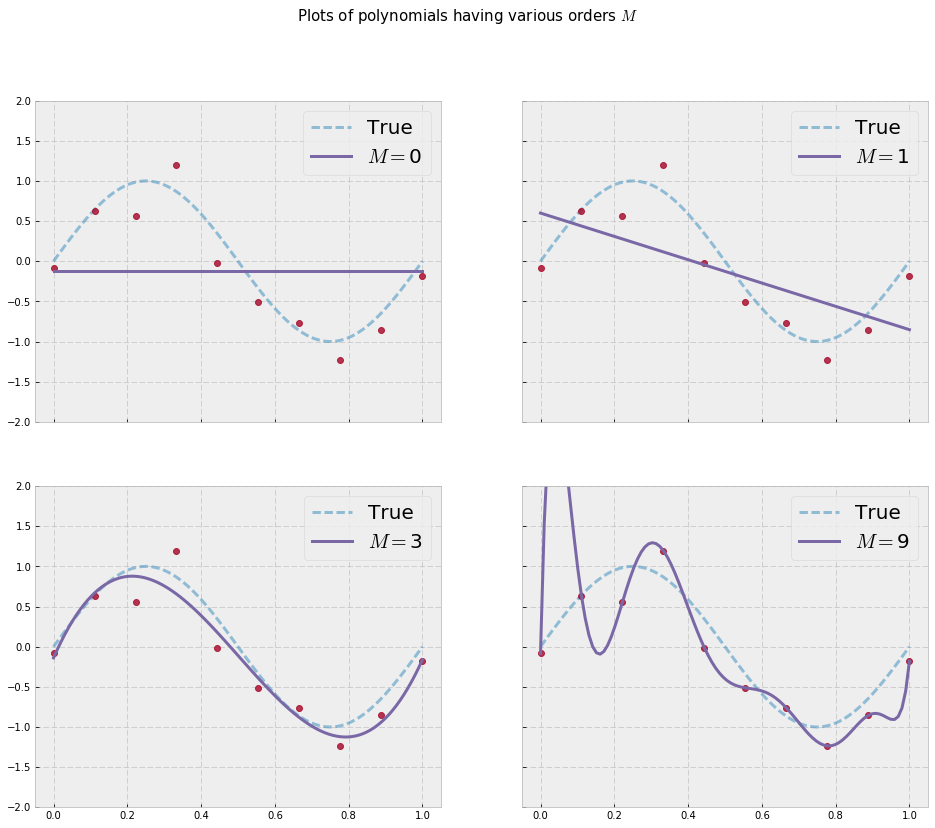

,M=0,M=1,M=3,M=9
0,-0.12627,0.599645,-0.139682,-0.083422
1,NaN,-1.451831,10.483091,199.729350
2,NaN,NaN,-31.185369,-4214.285342
3,NaN,NaN,20.680190,35299.333687
4,NaN,NaN,NaN,-153715.747052
5,NaN,NaN,NaN,387243.668122
6,NaN,NaN,NaN,-586675.183083
7,NaN,NaN,NaN,527833.894999
8,NaN,NaN,NaN,-259979.129984
9,NaN,NaN,NaN,54007.620884


In [11]:
import pandas as pd
from IPython.display import display

plt.rcParams["figure.figsize"] = (16,13)

fig, ax = plt.subplots(2, 2, sharex='all', sharey='all')
j = 0
ax[0,0].set_ylim(-2,2)

for M in ms :
    p, q = divmod(j, 2)
    X = np.array([ x**i for i in range(M+1) ])  
    y = (W[j].reshape(-1,1) * X).sum(axis=0)

    ax[p,q].plot(x, t, '--', lw=3, alpha=0.5, label="True")
    ax[p,q].plot(x_train, t_train, 'o', alpha=0.8)
    ax[p,q].plot(x, y, lw=3, label="$M=${}".format(M))
    ax[p,q].legend(loc='upper right', fontsize=20)

    j+=1

plt.suptitle('Plots of polynomials having various orders $M$', fontsize=15)
plt.show()

# 회귀계수를 모아서 테이블 형태로 출력
A = np.full((10, 4), np.nan)
for i in range(len(W)) :
    A[0:W[i].shape[0], i] = W[i]

df = pd.DataFrame(data=A,  columns=['M=0', 'M=1', 'M=3', 'M=9'])
display(df)  # OR print(df.to_html()) or display(HTML(df.to_html()))    

#### 평가하기

$$
E_{\text{RMS}} = \sqrt{\frac{2 E(\mathbf{w}^{*})}{N}}
$$

- 오차함수값에 루트를 씌워 데이터와 동일한 스케일을 가지도록 하고(오차함수에 이미 제곱이 되어있기 때문)

- $N$으로 나누어 평균적인 오차를 알아볼 수 있게 함.

- 2 곱하기는 오차함수에 (1/2)이 곱해져 있기 때문

In [12]:
def rms(w, E, M, x, t) :
    return np.sqrt( (2*E(w, M, x, t)) / x.shape[0] )

## 에러 평가

In [13]:
# M을 0~(M_overfit-1)에 대해서 한번씩 피팅
M_overfit = 10
Ms = np.arange(M_overfit)

# 피팅결과 구해진 파라미터를 W에 저장
W = []

# 학습데이터를 넘기면서 fitting
for M in Ms :
    x0 = np.random.uniform(-1, 1, M+1)
    W.append(minimize(E, x0, args=(M, x_train, t_train), 
                      jac=grad_anal, method="CGFR", verbose_step=500))   
    print('\n')

################################################################
# START OPTIMIZATION
################################################################
INIT POINT : [0.6652], dtype : float64
METHOD     : Conjugate gradient Fletcher-Reeves
##############
# START ITER.
##############
Iter:    1, |c|:  7.9150968, alpha:0.1000000, Cost:  2.5575776, d:[-7.9151], x:[-0.1263]
Stop criterion break
Iter:    2, |c|:  0.0000000, alpha:0.1000000, Cost:  2.5575776, d:[-7.9151], x:[-0.1263]


################################################################
# START OPTIMIZATION
################################################################
INIT POINT : [0.5563 0.74  ], dtype : float64
METHOD     : Conjugate gradient Fletcher-Reeves
##############
# START ITER.
##############
Iter:    1, |c|: 12.9219628, alpha:0.0797180, Cost:  2.8149997, d:[-10.526   -7.4954], x:[-0.2828  0.1425]
Stop criterion break
Iter:    3, |c|:  0.0000000, alpha:1.2316143, Cost:  1.4841548, d:[ 0.7165 -1.2945], x:[ 0.5996 -1.4

In [14]:
# 회귀계수를 모아서 테이블 형태로 출력
A = np.full((len(Ms), len(Ms)), np.nan)
for i in range(len(W)) :
    A[0:W[i].shape[0], i] = W[i]
    
df = pd.DataFrame(data=A,  columns=['M={}'.format(i) for i in range(len(Ms))])
display(df)  # OR print(df.to_html()) or display(HTML(df.to_html()))    

,M=0,M=1,M=2,M=3,M=4,M=5,M=6,M=7,M=8,M=9
0,-0.12627,0.599645,0.575188,-0.139682,-0.118120,-0.071224,-0.063581,-0.071229,-0.082299,-0.083389
1,NaN,-1.451831,-1.286746,10.483091,9.674486,5.402318,3.363237,11.646775,90.759834,202.888541
2,NaN,NaN,-0.165085,-31.185369,-27.101915,8.509237,33.664843,-103.034955,-1698.438670,-4288.128620
3,NaN,NaN,NaN,20.680190,14.130490,-86.530343,-194.799454,615.913576,12649.269190,35972.764939
4,NaN,NaN,NaN,NaN,3.274850,118.654939,327.878246,-1964.615672,-47359.578508,-156917.355261
5,NaN,NaN,NaN,NaN,NaN,-46.152031,-232.257029,3111.049435,97618.816546,396062.038473
6,NaN,NaN,NaN,NaN,NaN,NaN,62.034273,-2364.333536,-112623.363201,-601257.130661
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,693.273813,68198.850225,542100.768804
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-16876.415972,-267585.073385
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55709.128771


- 1차에서 9차까지 회귀 결과에 대해 학습, 테스트 데이터로 각각 RMS를 계산

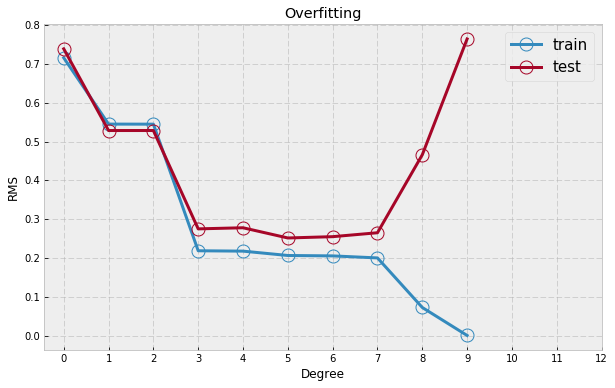

In [15]:
plt.rcParams["figure.figsize"] = (10,6)

RMS = np.zeros((len(Ms), 3))

for i in Ms :
    RMS[i, 0] = i
    RMS[i, 1] =rms(W[i], E, W[i].shape[0]-1, x_train, t_train)
    
for i in Ms :
    RMS[i, 2] =  rms(W[i], E, W[i].shape[0]-1, x_test, t_test)
    
plt.plot(RMS[:,0], RMS[:,1], 'o-', lw=3, markersize=13, fillstyle='none',  label='train')    
plt.plot(RMS[:,0], RMS[:,2], 'o-', lw=3, markersize=13, fillstyle='none', label='test')
plt.title('Overfitting')
plt.xticks( np.arange(13))

plt.xlabel('Degree')
plt.ylabel('RMS')

plt.legend(fontsize=15)
plt.show()

### 과적합<sup>Over-ftting</sup>

- 훈련 데이터에 잘 맞으나 그외의 데이터에 잘 맞지 않는 상태

- 위 그래프에서 다항식의 차수가 7차를 넘어가는 순간 과적합 발생

#### 더 많은 데이터를 모아서 해결

- 더 많은 데이터가 문제를 해결 할 수 있는지 실험

In [16]:
###########################################
# 9차로 더 많은 데이터를 모아 선형회귀 시도
###########################################
M = 9

x0 = np.random.uniform(-1, 1, M+1)

w = minimize(E, x0, args=(M, x_test, t_test), 
             jac=grad_anal, method="CGFR", verbose_step=500)

################################################################
# START OPTIMIZATION
################################################################
INIT POINT : [ 0.9535  0.2097  0.4785 -0.9216 -0.4344 -0.7596 -0.4077 -0.7625 -0.364  -0.1715], dtype : float64
METHOD     : Conjugate gradient Fletcher-Reeves
##############
# START ITER.
##############
Iter:    1, |c|: 63.3279922, alpha:0.0079720, Cost: 34.6190609, d:[-55.0826 -25.4412 -12.703   -5.2794  -0.6665   2.2853   4.2076   5.4711   6.3021   6.8429], x:[ 0.5144  0.0069  0.3773 -0.9637 -0.4397 -0.7414 -0.3742 -0.7189 -0.3138 -0.1169]
Iter:  501, |c|:  0.0000224, alpha:0.0008409, Cost:  1.9521170, d:[ 0.0002 -0.0006  0.0009  0.0004 -0.0014  0.0012 -0.0017 -0.0025  0.0035  0.0001], x:[ 2.2723e-01 -2.7935e+00  1.2770e+02 -1.1221e+03  5.5992e+03 -1.7202e+04  3.1588e+04 -3.3528e+04  1.8970e+04 -4.4295e+03]
Numerical unstable break : iter:  560, Cost_old:1.9521170, Cost_new:1.9521170


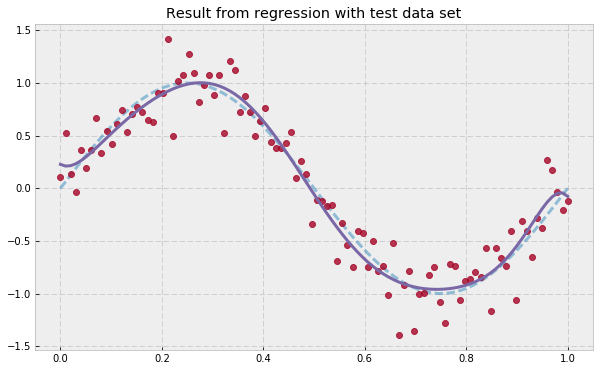

W:[ 2.2723e-01 -2.7935e+00  1.2770e+02 -1.1221e+03  5.5992e+03 -1.7202e+04  3.1588e+04 -3.3528e+04  1.8970e+04 -4.4295e+03]


In [17]:
###########################################
# 많은 데이터에 대한 회귀결과 출력
###########################################

plt.rcParams["figure.figsize"] = (10,6)

X = np.array([ x**i for i in range(M+1) ])  
y = (w.reshape(-1,1) * X).sum(axis=0)

plt.plot(x, t, '--', lw=3, alpha=0.5)
plt.plot(x_test, t_test, 'o', alpha=0.8)
plt.plot(x, y, lw=3)
plt.title("Result from regression with test data set")
plt.show()

print("W:{}".format(w.reshape(1,-1)[::-1][0].astype('float64')))

#### 레귤러라이제이션<sup>regularization</sup>를 통한 해결

- 현실적으로 데이터를 많이 모을 수 없음

- 우선 다음과 같은 항을 에러함수에 추가

$$
\tilde{E}(\mathbf{w}) = \frac{1}{2} \sum_{n=1}^{N} \left\{ y(x_n, \mathbf{w}) - t_n \right\}^2 + \color{OrangeRed}{\frac{\lambda}{2} \lVert \mathbf{w} \rVert^2}
$$

- 직관적 해석 : 에러함수에 $\mathbf{w}$의 요소가 제곱되어 다 더해진 항이 추가 되면서 $w_j$가 커지면 에러값이 커지게 설계

- 절편항에 대한 회귀 계수 $w_0$는 레귤러라이제이션에서 제외하는 경우도 있음(sklearn은 이런식으로 구현됨)

- 아래 코드에서 절편항을 포함하는 경우와 포함하지 않는 경우 어떻게 달라지는지 실험해 볼 수 있음.

- 절편항을 제외하는 이유

    - 예를 들어 타겟 $t$가 100 근처의 값이라고 하면 $w_0$는 $y$절편으로 역시 100 근처에서 결정
    - 이때 $t$에 모두 100씩 다 더하게 되면 $w_0$도 100만큼 커지고 예측값도 당연히 +100이 되어야 정상적이다. 즉 정확하게 그냥 100만큼 위로 쉬프트 된 것
    - 그런데 $w_0$를 레귤러항에 포함시키면 레귤러라이제이션이 강하게 걸리는 경우 $w_0$에도 레귤러라이제이션이 동작하게 되어 $w_0$가 타겟에 100을 더하기 전의 $w_0$보다 정확히 100만큼 큰 값으로 결정되지 않는다. 
    - 즉, 모든 데이터에 100만큼 더하면 절편의 높이도 100이 높아져야 하지만 절편항이 레귤러라이제이션에 포함되어 100만큼 커지지 않게 된다. 
    - 이를 두고 절편항이 타겟값의 원점에 의존<sup>[Tibshirani]</sup>하게 된다고 이야기하고 이런 상황을 피하기 위해 절편항은 레귤러라이제이션에서 제외하기도 한다.
    - intersection.ipynb에서 실험으로 확인

In [18]:
###########################################
# L2 Reg. term을 가진 에러함수를 다시 정의하고 피팅 시도
###########################################
def E(w, M, x, t):
    """
    Error function with L2 Reg. term
    """
    lamda = np.exp(-10)
    
    X = np.array([ x**i for i in range(M+1) ])  
    y = (w.reshape(-1,1) * X).sum(axis=0)
    
    #                                                L2 reg. term
    return 0.5*(( (y - t)**2 ).sum()) + (lamda/2.) * np.linalg.norm(w[1:])**2

# print(np.exp(-10))
x0 = np.random.uniform(-1, 1, M+1)
w = minimize(E, x0, args=(M, x_test, t_test), 
             jac=grad_anal, method="CGFR", verbose_step=500)

################################################################
# START OPTIMIZATION
################################################################
INIT POINT : [-0.8717  0.3849  0.1332 -0.4692  0.0465 -0.8121  0.1519  0.8586 -0.3629  0.3348], dtype : float64
METHOD     : Conjugate gradient Fletcher-Reeves
##############
# START ITER.
##############
Iter:    1, |c|: 79.7961225, alpha:0.0070223, Cost: 33.9239165, d:[75.5898 21.3875  9.2132  5.5464  4.2864  3.8077  3.5988  3.4834  3.398   3.3202], x:[-0.3409  0.5351  0.1979 -0.4303  0.0766 -0.7854  0.1772  0.8831 -0.339   0.3581]
Numerical unstable break : iter:  215, Cost_old:2.1792792, Cost_new:2.1792792


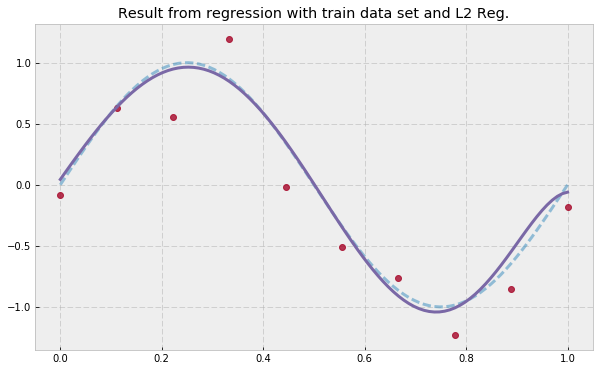

W:[  0.0439   5.8902  -1.5566 -34.2345  13.1883  26.5648  10.1927  -9.8601 -15.398    5.109 ]


In [19]:
###########################################
# L2 레귤러라이제이션 결과 출력
###########################################
plt.rcParams["figure.figsize"] = (10,6)

X = np.array([ x**i for i in range(M+1) ])  
y = (w.reshape(-1,1) * X).sum(axis=0)

plt.plot(x, t, '--', lw=3, alpha=0.5)
plt.plot(x_train, t_train, 'o', alpha=0.8)
plt.plot(x, y, lw=3)
plt.title("Result from regression with train data set and L2 Reg.")
plt.show()

print("W:{}".format(w.reshape(1,-1)[::-1][0]))

- 레귤러라이제이션 사용 결과 : 많은 데이터를 모으지 않고도 9차 다항식으로 괜찮은 결과 생성

- 주로 사용되는 레귤러라이제이션 : L1, L2 레귤러라이제이션

- 아래는 L1, L2 노름의 형상화

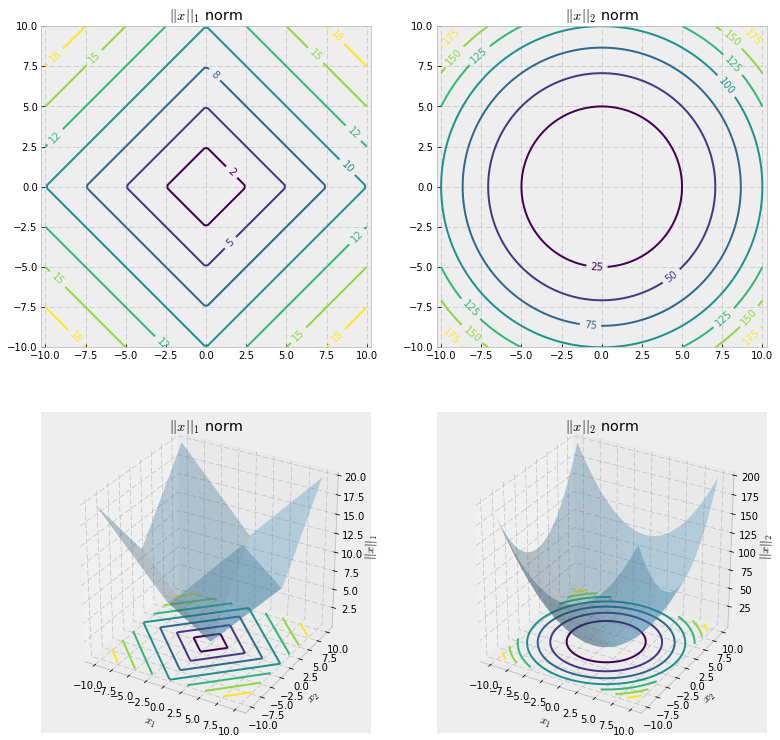

In [20]:
plt.rcParams["figure.figsize"] = (13,13)

w = np.linspace(-10,10,100)
W1, W2 = np.meshgrid(w, w)

#L2
L2 = W1**2 + W2**2

#L1 
L1 = np.abs(W1) + np.abs(W2)

fig = plt.figure()
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2)
ax3 = fig.add_subplot(2, 2, 3, projection='3d')
ax4 = fig.add_subplot(2, 2, 4, projection='3d')

CS = ax1.contour(W1, W2, L1)
ax1.clabel(CS, CS.levels,  fmt='%1.0f', inline=True, fontsize=10)
ax1.axis('equal')
ax1.set_title(r'$||x||_{1}$ norm')

CS = ax2.contour(W1, W2, L2)
ax2.clabel(CS, CS.levels,  fmt='%1.0f', inline=True, fontsize=10)
ax2.axis('equal')
ax2.set_title(r'$||x||_{2}$ norm')

ax3.plot_surface(W1, W2, L1, rstride=5, cstride=5, alpha=0.3)
cset = ax3.contour(W1, W2, L1, zdir='z', offset=0, cmap='viridis')
ax3.set_xlabel(r'$x_1$')
ax3.set_ylabel(r'$x_2$')
ax3.set_zlabel(r'$||x||_{1}$')
ax3.set_title(r'$||x||_{1}$ norm')

ax4.plot_surface(W1, W2, L2, rstride=5, cstride=5, alpha=0.3)
cset = ax4.contour(W1, W2, L2, zdir='z', offset=0, cmap='viridis')
ax4.set_xlabel(r'$x_1$')
ax4.set_ylabel(r'$x_2$')
ax4.set_zlabel(r'$||x||_{2}$')
ax4.set_title(r'$||x||_{2}$ norm')

plt.show()

### 제약 최적화로써의 레귤러라이제이션<sup>$\dagger$</sup>

- 에러함수에  레귤러라이제이션 항을 추가하는 것에 대한 최적화관점으로 이해해보자.

- 일반적인 레귤러라이제이션 항이 첨가된 에러함수

$$
\frac{1}{2} \sum_{n=1}^{N} \{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n) \}^2 + \frac{\lambda}{2} \sum_{j=1}^{M} \lvert w_j \rvert ^q \tag{1.2}
$$


- 레귤러라이제이션 하지 않은 에러함수

$$
E_{D}(\mathbf{w}) = \frac{1}{2} \sum_{n=1}^{N} \{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n) \}^2
$$

- 레귤러라이제이션에 대응하는 다음과 같은 부등식 제약조건이 있을 때

$$
\sum_{j=1}^{M} \lvert w_j \rvert ^q \le \eta
$$

- 레귤러라이제이션하지 않은 에러함수를 부등식 제약조건에 대해서 최소화하는 것은 식(1.2)를 최소화하는 것과 동일한 결과를 가져온다.

- 즉, 레귤라이제이션 항은 회귀계수의 제약조건으로 기능하게 됨

- 왜 그런가?

- 다음 최소화 문제가 식(1.2)의 최소화 문제와 같음을 보이자.

$$
\begin{align}
\text{Minimize} \quad &\frac{1}{2} \sum_{n=1}^{N} \{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n) \}^2 \\[5pt]
\text{s.t.} \quad &\sum_{j=1}^{M} \lvert w_j \rvert ^q \le \eta
\end{align} \tag{1.3}
$$

- 부등식 제약조건에 대한 라그랑지 승수를 $u$로 쓰고 라그랑지안을 구성하면

$$
\mathcal{L}(\mathbf{w}, u) = \frac{1}{2} \sum_{n=1}^{N} \{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n) \}^2 + u \left(  \sum_{j=1}^{M} \lvert w_j \rvert ^q - \eta \right)
$$

- $u = \dfrac{\lambda}{2}$인 관계를 가지는 라그랑지승수 $\lambda$로 교체하면

$$
\mathcal{L}\left(\mathbf{w}, \frac{\lambda}{2} \right) = \frac{1}{2} \sum_{n=1}^{N} \{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n) \}^2 + \frac{\lambda}{2} \sum_{j=1}^{M} \lvert w_j \rvert ^q - \frac{\lambda}{2} \eta
$$

- 위 식과 식(1.2)를 비교하면 $- \frac{\lambda}{2} \eta$는 $\mathbf{w}$에 대해 상수이므로 최소화 결과에 영향을 미치지 않음 

- 다만 $\eta$값은 제약최적화 문제 풀이 과정에서 라그랑지 승수 $\lambda$의 결정에 영향을 미침

- 식(1.2)에서  $\lambda$를 임의로 설정하고, 식(1.3)의 문제를 풀 때 $\eta$를 적절히 조정하여 식(1.3)의 최적해에 대한 라그랑지 승수가 식(1.2)의 $\lambda$와 같아지게 하면

- 적절한 $\eta$값에 대해서 식(1.3)와 식(1.2)은 동일한 최적해를 가지게 됨

- 그렇다면 그 적절한 $\eta$와 $\lambda$의 관계는?

- $\mathcal{L}\left(\mathbf{w}, \dfrac{\lambda}{2}  \right)$에 대한 최적해 $\mathbf{w}^{*}$는 KKT 조건 중 전환조건(일반적인 모양: $u_i g_i(\mathbf{x})=0$)

$$
\frac{\lambda}{2}\left(  \sum_{j=1}^{M} \lvert w_j^{*} \rvert ^q - \eta \right) = 0
$$

을 만족 시켜야 한다. 

- 한편 임의의 $\lambda$에 대해서 식(1.2)를 최소화 시켜 얻은 최적해를 $\mathbf{w}^*(\lambda)$로 쓰면 어떤 적절한 $\eta$에 대해서 제약최소화문제의 해도 $\mathbf{w}^*(\lambda)$가 될것이다.

- 그 $\mathbf{w}^*(\lambda)$는 위 전환조건을 만족시켜야 하므로

$$
\frac{\lambda}{2}\left(  \sum_{j=1}^{M} \lvert w_j^{*}(\lambda) \rvert ^q - \eta \right) = 0 \\[5pt]
\frac{\lambda}{2}  \sum_{j=1}^{M} \lvert w_j^{*}(\lambda) \rvert ^q - \frac{\lambda}{2} \eta = 0 \\[5pt]
- \frac{\lambda}{2} \eta = - \frac{\lambda}{2}  \sum_{j=1}^{M} \lvert w_j^{*}(\lambda) \rvert ^q 
$$
$$
\therefore \eta = \sum_{j=1}^{M} \lvert w_j^{*}(\lambda) \rvert ^q \tag{1.4}
$$

- 위 식은 다음과 같은 사실을 의미한다.

    - 식(1.2)에서 $\lambda$값이 증가하면 $\mathbf{w}$의 결정범위가 줄어들면서 일반화가 되는 것을 실험을 통해 확인

    - 위 식에 의해 $\mathbf{w}$의 합이 $\eta$가 되므로 $\lambda$가 증가하면 $\eta$는 감소

    - 반대로 $\eta$감소 $\to$ $\lambda$ 증가

<table border="1">
<tr>
<td>
<img src="imgs/Figure3.4a.png" width="325"/>
</td>
<td>
<img src="imgs/lin-reg-3b.png" />
</td>
</tr>
<tr><td colspan="2">PRML figure 3.4 (Modified)</td></tr>
</table>

### L1, L2 레귤러라이제이션 실험

- 아래는 L1, L2 레귤러라이제이션의 실험코드

- 에러 함수안에 lamda를 변화시켜가면서 제약조건과 최적해거 어떻게 결정되는지 확인

- L1 레귤러라이제이션항이 추가된 목적함수는 미분 불가능한 점이 생김

- L1 레귤러라이제이션의 경우 $w_j=0$인 지점에서 미분계수 0을 사용

- 이를 위해 L1항이 추가된 목적함수는 수치 미분하지 않고 직접 미분한 함수를 사용<sup>[3],[4],[5]</sup> 


In [21]:
#
# L1, L2 Reg.의 효과를 비교하기 위한 프로그램
# 

def E_(w, M, x, t):
    """
    Error function without Reg. term
    """
    X = np.array([ x**i for i in range(M+1) ])  
    y = (w.reshape(-1,1) * X).sum(axis=0)
    
    return  0.5*(( (y - t)**2 ).sum()) 


def E(w, M, x, t):
    """
    Error function with L1 or L2 Reg. term
    Calculate differently according to global variable regularizer
    """
    N = x.shape[0]
    
    X = np.array([ x**i for i in range(M+1) ])  
    y = (w.reshape(-1,1) * X).sum(axis=0)
    
    if regularizer == 'L2' :
        # L2 reg.
        if not reg_intercept :
            return 0.5*(( (y - t)**2 ).sum()) + (lamda/2.)*np.linalg.norm(w[1:])**2 
        else :
            return 0.5*(( (y - t)**2 ).sum()) + (lamda/2.)*np.linalg.norm(w)**2   
    elif regularizer == 'L1' :
        # L1 reg.
        if not reg_intercept :
            return 0.5*(( (y - t)**2 ).sum()) + (lamda/2.)*(np.abs(w[1:]).sum()) 
        else :
            return 0.5*(( (y - t)**2 ).sum()) + (lamda/2.)*(np.abs(w).sum())   
    else :
        return 0.5*(( (y - t)**2 ).sum())
       
def grad_L1(w, M, x, t):
    """
    This function computes the analytic gradient of the objective function with L1 reg. term
    x, t : data for error function eval.
    """
    # 다항함수를 기반으로하는 design matrix Φ를 만든다.
    PI = np.hstack( (np.power(x.reshape(N,1), p) for p in range(M+1)) )
    g = np.dot(w.T, np.dot(PI.T, PI) ) - np.dot(t.T, PI)
    
    if not reg_intercept :
        g_reg = np.hstack( (0 , (lamda/2.)*np.sign(w[1:])) ) 
    else :
        g_reg = (lamda/2.)*np.sign(w)                     
    
    g += g_reg
    
    return g

In [22]:
###############################################################
# 전역변수 설정

# 직선으로 회귀, 여기서는 바꾸면 안됨, w의 그림을 그리기 위해. 2개 이상되면 그림 못 그림
M = 1          

# 레귤러라이제이션 상수이자 동시에 제약조건에 할당된 라그랑지승수
lamda = None         

# L1 or L2 레귤러라이제이션 선택
regularizer = 'L1' 

# 레귤러라이제이션에서 절편항을 포함시킬지 말지를 결정
reg_intercept = True
################################################################

# 여기서 람다를 바꿔가면서 여러번 fit
if regularizer == 'L1' :
    lambdas = np.linspace(0, 3, 30)
else :
    lambdas = np.linspace(0, 15, 40)
    
ws = np.zeros((len(lambdas), M+1))

x0 = np.random.uniform(-1, 1, M+1)

for i, lamda in enumerate(lambdas) :
    if regularizer == 'L1' :
        # L1 레귤러의 경우 수치 안정성을 위해 직접 미분한 그래디언트 함수 사용
        w = minimize(E, x0, args=(M, x_train, t_train), 
                     jac=grad_L1, strict=False, max_iter=1500, verbose=False)
    else :
        w = minimize(E, x0, args=(M, x_train, t_train), max_iter=1500, verbose=False)
        
    ws[i,:] = w
    print("lambda:{:f}, w:{}".format(lamda, w))

lambda:0.000000, w:[ 0.5996 -1.4518]
lambda:0.103448, w:[ 0.5564 -1.3757]
lambda:0.206897, w:[ 0.5131 -1.2995]
lambda:0.310345, w:[ 0.4699 -1.2233]
lambda:0.413793, w:[ 0.4266 -1.1471]
lambda:0.517241, w:[ 0.3833 -1.071 ]
lambda:0.620690, w:[ 0.3401 -0.9948]
lambda:0.724138, w:[ 0.2968 -0.9186]
lambda:0.827586, w:[ 0.2536 -0.8424]
lambda:0.931034, w:[ 0.2103 -0.7663]
lambda:1.034483, w:[ 0.167  -0.6901]
lambda:1.137931, w:[ 0.1238 -0.6139]
lambda:1.241379, w:[ 0.0805 -0.5377]
lambda:1.344828, w:[ 0.0373 -0.4615]
lambda:1.448276, w:[-2.4509e-14 -3.9391e-01]
lambda:1.551724, w:[-1.8180e-15 -3.7909e-01]
lambda:1.655172, w:[-8.2560e-16 -3.6444e-01]
lambda:1.758621, w:[-2.7375e-16 -3.4971e-01]
lambda:1.862069, w:[-2.4147e-15 -3.3509e-01]
lambda:1.965517, w:[-5.4330e-16 -3.2051e-01]
lambda:2.068966, w:[-7.6670e-16 -3.0544e-01]
lambda:2.172414, w:[-1.0954e-15 -2.9097e-01]
lambda:2.275862, w:[-5.8109e-18 -2.7625e-01]
lambda:2.379310, w:[ 6.5691e-18 -2.6156e-01]
lambda:2.482759, w:[-5.8238e-17 

In [23]:
######################################################
# 2개의 파라미터로 회귀한 결과를 출력
# 파라미터가 2개라서 에러함수는 2변수 실함수가 되고 등고선 플롯으로 그릴 수 있다.
# 비제약 최적해와 제약조건산에 결정된 최적해 비교
######################################################

plt.rcParams["figure.figsize"] = (14,7)

# 회귀계수 공간에서 메쉬그리드 만들기
ww = np.linspace(-2, 2, 200)
W1, W2 = np.meshgrid(ww, ww)
W = np.array([W1, W2])

# 앞선 9차까지 순차적으로 계샌해둔 결과중에서 직선회귀 결과를 이용해서
# 무제약 최적해를 초기화
w_unconst =  np.array(A[0:2,1])

#############################################################
# 제약조건 함수
L2 = W1**2 + W2**2 #L2
L1 = np.abs(W1) + np.abs(W2) #L1 
L = {'L1':L1, 'L2':L2}
#############################################################

#############################################################
# 제약조건에 나타나는 eta 계산 eq(1.4)
eta_L1 = np.abs(ws[0,:]).sum()
eta_L2 = (ws[0,:]**2).sum()
eta = {'L1':eta_L1, 'L2':eta_L2}
#############################################################

#############################################################
# 에러함수의 제약조건 있는 상태와 없는 상태를 계산
# 루프 돌리면 구현은 직관적이나 비효율적
E_unconst = np.zeros_like(W1)
E_const = np.zeros_like(W1)

for i in range(W1.shape[0]) :
    for j in range(W1.shape[1]) :
        E_unconst[i,j] = E_(W[:,i,j], M, x_train, t_train) 
        E_const[i,j]   = E(W[:,i,j], M, x_train, t_train) 
#############################################################

fig = plt.figure()
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)

# 여기서 바로 애니메이션으로 만들기
from matplotlib import animation, rc
from IPython.display import HTML


##################################################################################
# ax1
# 무제약 에러함수 그림
CS1 = ax1.contour(W1, W2, E_unconst,  levels=[2, 3, 4, 8, 16, 24, 32, 40, 48])
ax1.clabel(CS1, CS1.levels,  fmt='%.3f', inline=True, fontsize=10)

# 제약 최적해와 무제약 최적해를 그림
# 유용 영역 그림
CS1_cst = ax1.contourf(W1, W2, L[regularizer], levels=[0, eta[regularizer]], alpha=0.4)
sol1, = ax1.plot(ws[:,0], ws[:,1], '.', color=style_colors[7], label='Solution')
ax1.plot(*w_unconst, 'o', color=style_colors[1])
ax1.set_xlabel('$W_0$', fontsize=15)
ax1.set_ylabel('$W_1$', fontsize=15)
ax1.legend(fontsize=15)
ax1.set_title('Unconstrained error func. and its feasible region')
ax1.axis('equal')

##################################################################################
# ax2
# 제약 에러함수 그림
CS2 = ax2.contour(W1, W2, E_const, levels=[2, 3, 4, 8, 16, 24, 32, 40, 48])
ax2.clabel(CS2, CS2.levels,  fmt='%.3f', inline=True, fontsize=10)

# 제약 최적해
sol2, = ax2.plot(ws[:,0], ws[:,1], '.', color=style_colors[7], label='Solution')
ax2.set_xlabel('$W_0$', fontsize=15)
ax2.set_ylabel('$W_1$', fontsize=15)
ax2.set_title('Constrained error func.')
ax2.axis('equal');


def update(i):
    global CS1_cst, CS2, lamda
    
    # 유용역역 업데이트
    #############################################################
    # 제약조건에 나타나는 eta 계산 eq(1.4)
    eta_L1 = np.abs(ws[i,:]).sum()
    eta_L2 = (ws[i,:]**2).sum()
    eta = {'L1':eta_L1, 'L2':eta_L2}
    
    for c in CS1_cst.collections:
        c.remove()  # removes only the contours, leaves the rest intact
    CS1_cst = ax1.contourf(W1, W2, L[regularizer], levels=[0, eta[regularizer]], alpha=0.4)
    
    #############################################################
    # 제약조건 추가된 에러함수 업데이트
    lamda = lambdas[i]
    for j in range(W1.shape[0]) :
        for k in range(W1.shape[1]) :
            E_const[j,k]   = E(W[:,j,k], M, x_train, t_train) 
            
    for c in CS2.collections:
        c.remove()  # removes only the contours, leaves the rest intact
    CS2 = ax2.contour(W1, W2, E_const, levels=[2, 3, 4, 8, 16, 24, 32, 40, 48])

    #솔루션 업데이트
    sol1.set_data(ws[i,0], ws[i,1])
    sol2.set_data(ws[i,0], ws[i,1])

# 이 부분은 시간이 많이 걸리기 때문에 필요할때만 주석을 제거하여 실행해야함    
ani = animation.FuncAnimation(fig, update, frames=np.arange(ws.shape[0]), interval=100)
# gif로 출력하려면 다음 라인 사용한다. imagemagick 라이브러리가 설치되어 있어야 함.
# ani.save('L2.gif', dpi=80, writer='imagemagick')
rc('animation', html='html5')
HTML(ani.to_html5_video())

#### 실험코드와 sklearn 레귤러라이제이션 비교

- L1, L2 레귤러라이제이션 결과를 sklearn 결과와 비교해보기

- sklearn은 절편을 레귤러라이제이션이 포함시키지 않기 때문에 <span class="code-body">reg_intercept=False</span>로 설정

- sklearn의 레귤러라이제이션 상수
    - L1 : $\alpha = \dfrac{\lambda}{2N}$
    - L2 : $\alpha = \lambda$ 


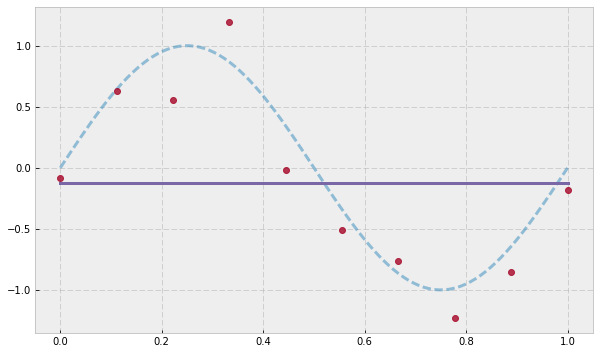

lambda : 4.000000
Constrained optimum w
[[-1.2618e-01]
 [ 8.0790e-16]]
Constraint : |w0|+|w1| <= 0.126183
sklearn coef. : [-0.], Intercept:-0.1263


In [24]:
lamda = 4.0          
regularizer = 'L1' 
reg_intercept = False #절편을 레귤러항에서 제외(sklearn과 결과 비교를 위해서 )

x0 = np.random.uniform(-1, 1, M+1)
        
if regularizer == 'L1' :
    # L1 레귤러의 경우 수치 안정성을 위해 직접 미분한 그래디언트 함수 사용
    w = minimize(E, x0, args=(M, x_train, t_train), 
                     jac=grad_L1, strict=False, verbose=False)
else :
    w = minimize(E, x0, args=(M, x_train, t_train))
        

# 제약조건에 나타나는 eta 계산, 계산된 eta가 lambda와 적절하게 유용영역의 경계를
# 이루는지 확인
eta_L1 = np.abs(w).sum()
eta_L2 = (w**2).sum()
eta = {'L1':eta_L1, 'L2':eta_L2}

X = np.array([ x**i for i in range(M+1) ])  
y = (w.reshape(-1,1) * X).sum(axis=0)

#위에서 동영상을 만들면서 figure를 plot하지 않았으므로 한번 닫아주고 다시 그린다.
plt.close()
plt.rcParams["figure.figsize"] = (10,6)
fig = plt.figure()
ax1 = fig.add_subplot(1,1,1)
ax1.plot(x, t, '--', lw=3, alpha=0.5)
ax1.plot(x_train, t_train, 'o', alpha=0.8)
ax1.plot(x, y, lw=3)
plt.show()

##########################################################
# sklearn ridge or lasso
# sklearn alpha param.
# L2
#     objective : Objective(No reg. term) + λ/2 * L2-norm
#     alpha = λ
# L1 
#     objective : Objective(No reg. term) + λ/2N * L1-norm
#     alpha = λ/2N
#############################################################
if regularizer == 'L1':
    model = make_pipeline(PolynomialFeatures(M), Lasso(alpha=lamda/(2*N)))
else :
    model = make_pipeline(PolynomialFeatures(M), Ridge(alpha=lamda))
    
model.fit(x_train[:, np.newaxis], t_train)

print("lambda : {:f}".format(lamda))
print("Constrained optimum w")
print(w.reshape(-1,1))

if regularizer == 'L1':
    print("Constraint : |w0|+|w1| <= {:f}".format(eta[regularizer]))
else :
    print("Constraint : (w1)^2 + (w2)^2 <= {:f}".format(eta[regularizer]))

print("sklearn coef. : {}, Intercept:{:.4f}".format(model.steps[-1][1].coef_[::-1][:-1], model.steps[-1][1].intercept_))

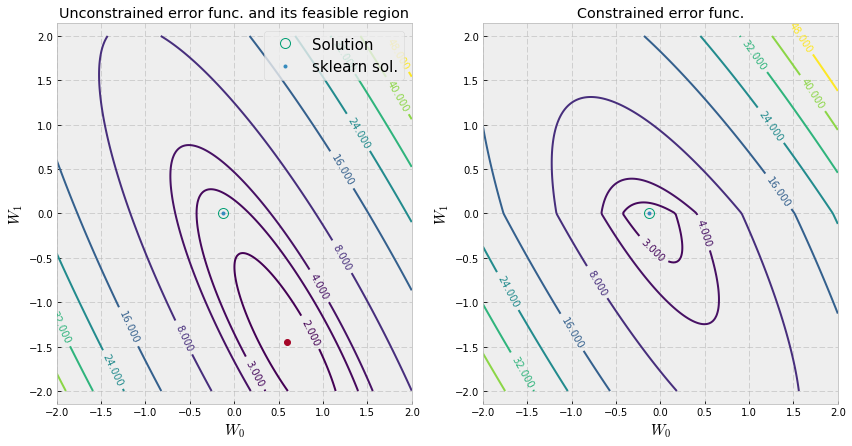

Constrained optimum w
[[-1.2618e-01]
 [ 8.0790e-16]]
Constraint : |w0|+|w1| <= 0.126183
sklearn coef. : -0.0000000, Intercept:-0.1263


In [25]:
######################################################
# 2개의 파라미터로 회귀한 결과를 출력
# 파라미터가 2개라서 에러함수는 2변수 실함수가 되고 등고선 플롯으로 그릴 수 있다.
# 비제약 최적해와 제약조건산에 결정된 최적해 비교
######################################################
plt.rcParams["figure.figsize"] = (14,7)

# 회귀계수 공간에서 메쉬그리드 만들기
ww = np.linspace(-2, 2, 200)
W1, W2 = np.meshgrid(ww, ww)
W = np.array([W1, W2])

# 미리 계산해둔 무제약 최적해를 초기화
w_unconst =  np.array(A[0:2,1])

# 제약조건에 나타나는 eta 계산, 계산된 eta가 lambda와 적절하게 유용영역의 경계를
# 이루는지 확인
eta_L1 = np.abs(w).sum()
eta_L2 = (w**2).sum()
eta = {'L1':eta_L1, 'L2':eta_L2}

#############################################################
# 제약조건을 그리기 위한 계산
#L2
L2 = W1**2 + W2**2
#L1 
L1 = np.abs(W1) + np.abs(W2)

L = {'L1':L1, 'L2':L2}
#############################################################

#############################################################
# 에러함수의 제약조건 있는 상태와 없는 상태를 계산
# 루프 돌리면 구현은 직관적이나 비효율적
E_unconst = np.zeros_like(W1)
E_const = np.zeros_like(W1)

for i in range(W1.shape[0]) :
    for j in range(W1.shape[1]) :
        E_unconst[i,j] = E_(W[:,i,j], M, x_train, t_train) 
        E_const[i,j]   = E(W[:,i,j], M, x_train, t_train) 
#############################################################

fig = plt.figure()
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)

##################################################################################
# ax1
# 무제약 에러함수 그림
CS = ax1.contour(W1, W2, E_unconst,  levels=[2, 3, 4, 8, 16, 24, 32, 40, 48])
ax1.clabel(CS, CS.levels,  fmt='%.3f', inline=True, fontsize=10)

# 제약 최적해와 무제약 최적해를 그림
ax1.plot(*w_unconst, 'o', color=style_colors[1])
ax1.plot(*w, 'o', fillstyle='none', color=style_colors[7], markersize=10, label='Solution')
ax1.plot(model.steps[-1][1].intercept_, model.steps[-1][1].coef_[::-1][:-1], '.', label='sklearn sol.')
ax1.set_xlabel('$W_0$', fontsize=15)
ax1.set_ylabel('$W_1$', fontsize=15)
ax1.legend(fontsize=15)
ax1.set_title('Unconstrained error func. and its feasible region')
ax1.axis('equal')

##################################################################################
# ax2
# 제약 에러함수 그림
CS = ax2.contour(W1, W2, E_const, levels=[2, 3, 4, 8, 16, 24, 32, 40, 48])
ax2.clabel(CS, CS.levels,  fmt='%.3f', inline=True, fontsize=10)

# 제약 최적해
ax2.plot(*w, 'o', fillstyle='none', color=style_colors[7], markersize=10, label='Solution')
ax2.plot(model.steps[-1][1].intercept_, model.steps[-1][1].coef_[::-1][:-1], '.', label='sklearn sol.')
ax2.set_xlabel('$W_0$', fontsize=15)
ax2.set_ylabel('$W_1$', fontsize=15)
ax2.set_title('Constrained error func.')
ax2.axis('equal');

plt.show()

print("Constrained optimum w")
print(w.reshape(-1,1))

if regularizer == 'L1':
    print("Constraint : |w0|+|w1| <= {:f}".format(eta[regularizer]))
else :
    print("Constraint : (w1)^2 + (w2)^2 <= {:f}".format(eta[regularizer]))

print("sklearn coef. : {:.7f}, Intercept:{:.4f}".format(model.steps[-1][1].coef_[::-1][:-1][0], 
                                                        model.steps[-1][1].intercept_))

- 위 결과 sklearn 결과와 정확하게 일치하는 것을 확인할 수 있음.

- $\lambda$ 값을 바꿔가면서 실험하면서 확인

- 다음처럼 각각 이름을 붙여서 부르기도 함.

- L2 레귤러라이제이션을 사용한 경우 : 능선회귀<sup>ridge regression[why-ridge]</sup>

- L1 레귤러라이제이션을 사용한 경우 : 라쏘회귀<sup>lasso regression(least absolute shrinkage and selection operator)</sup>
    - 미분 불가능으로 최적화 하기 까다로우나 0이 되는 파라미터가 많이 생겨 효율이 좋음

- 아래는 L1, L2 레귤러항이 추가되었을 때 목적함수의 모양을 그려본 것

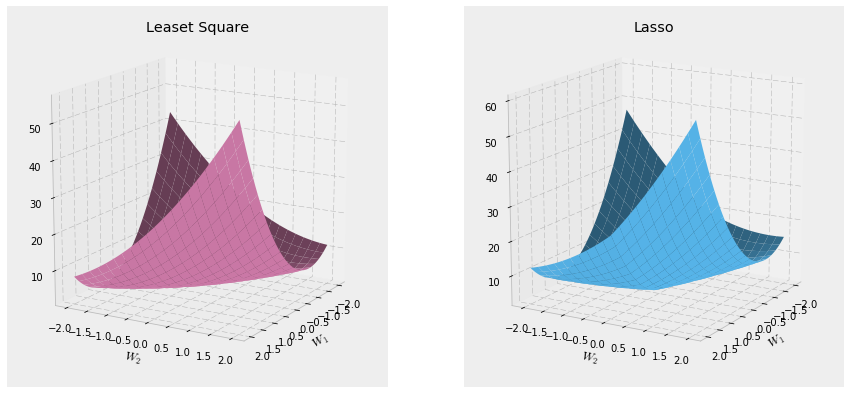

In [26]:
######################################################
# 릿지 회귀의 에러함수를 그려서
# 왜 릿지 회귀라는 이름이 붙었는지 확인
######################################################

%matplotlib inline

plt.rcParams["figure.figsize"] = (15,7)

fig = plt.figure()
ax1 = fig.add_subplot(1,2,1, projection='3d')
ax1.plot_surface(W1, W2, E_unconst, rstride=10, color=style_colors[5],  cstride=10, alpha=1)
ax1.view_init(15, 30)
ax1.set_xlabel('$W_1$')
ax1.set_ylabel('$W_2$')
ax1.set_title("Leaset Square")

ax2 = fig.add_subplot(1,2,2, projection='3d')
ax2.plot_surface(W1, W2, E_const, rstride=10,  color=style_colors[6], cstride=10,  alpha=1)
ax2.view_init(15, 30)
ax2.set_xlabel('$W_1$')
ax2.set_ylabel('$W_2$')

if regularizer == 'L1' :
    ax2.set_title("Lasso")
else:
    ax2.set_title("Ridge")

In [27]:
# https://plot.ly/python/
# https://plot.ly/python/offline/

# hover contour off
# https://community.plot.ly/t/trace-lines-appearing-on-hover/5801
data = [
    go.Surface(x=W1, y=W2, z=E_const, showscale=False, colorscale='Viridis',
               contours=dict(
                   x=dict(show=True, highlight=True),
                   y=dict(show=True,  highlight=True),
                   z=dict(show=True,  highlight=True),
               ),
    ),
]

layout = go.Layout(
    title='Regularized Objective Function',
    autosize=False, 
    width=600, height=600,
    margin=dict(l=0, r=0, b=0, t=30)
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

## 정규방정식<sup>Normal equation</sup>을 이용한 선형회귀<sup>[Bishop]</sup>


- $y(\mathbf{x}_{n},\mathbf{w})$를 구체적인 $D$차원 벡터에 대한 기저함수 형식으로 쓰면 

$$
\color{OrangeRed}{y(\mathbf{x}_{n},\mathbf{w}) = \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n)} \tag{2.1}
$$

- 여기서 $\mathbf{x}_n$은 $D$차원 벡터인 입력 데이터, $\boldsymbol{\phi}(\mathbf{x}_n)$은 $\mathbb{R}^{D} \longrightarrow \mathbb{R}^{M}$인 다변수 벡터함수

- 경사강하법을 이용한 실습에서 $M$은 다항식의 차수, 여기서는 기저함수의 개수!! 혼동주의!

- 즉, $\color{OrangeRed}{\mathbf{w} = (w_{0}, \cdots ,w_{M-1})^{\text{T}}}$, $\color{OrangeRed}{\boldsymbol{\phi}(\mathbf{x}) = (\phi_{0}(\mathbf{x}), \cdots , \phi_{M-1}(\mathbf{x}))^{\text{T}}}$ 

- $\phi_{j}(\mathbf{x})$는 일반적으로 다변수 실함수<sup>vector valued scalar function</sup>

- 앞선 경사하강법에서는 다항 기저 일변수 실함수<sup>scalar valued scalar function</sup> $\phi_{j}(x)= x^{j}$

- 구체적으로 써보면($D=1$인 경우)

$$
\boldsymbol{\phi}(x) = \begin{Bmatrix} \phi_0(x) \equiv x^0 \\ \phi_1(x) \equiv x^1 \\ \vdots \\ \phi_{M-1}(x) \equiv x^{M-1} \end{Bmatrix}
$$



- 기저함수를 정의하면서 식(2.1)은 더 이상 $\mathbf{x}_n$에 대해 선형이 아닌데 선형회귀에서 이야기하는 이유는 $\mathbf{w}$에 대해 선형이기 때문

- 기저함수를 쓰지않고 입력변수에 대해서도 선형으로 피팅을 할 경우는 

$$
\color{RoyalBlue}{y(\mathbf{x}_{n},\mathbf{w}) = \mathbf{w}^{\text{T}} \mathbf{x}_n} \tag{2.2}
$$

- 이때 $\color{RoyalBlue}{\mathbf{w} = (w_{1}, \cdots ,w_{D})^{\text{T}}}$, $\color{RoyalBlue}{\mathbf{x} = (x_{1}, \cdots ,x_{D})^{\text{T}}}$

- 기저함수를 쓰는 경우 
    - $N$ : 데이터의 개수
    - $\mathbf{w}$의 차원 : 기저함수 개수 $M$

- 기저함수를 쓰지 않는 경우 
    -  $N$ : 데이터의 개수
    - $\mathbf{w}$의 차원 : 입력변수의 차원과 동일한 $D$
    
- 따라서 미분해야하는 원식은

- 기저함수를 쓰는 경우

$$
\color{OrangeRed}{E_{D}(\mathbf{w}) = \frac{1}{2} \sum_{n=1}^{N} \left\{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n)  \right\}^{2}} \tag{2.3}
$$

- 그냥 입력변수에 대해서 선형인 경우

$$
\color{RoyalBlue}{E_{D}(\mathbf{w}) = \frac{1}{2} \sum_{n=1}^{N} \left\{ t_n - \mathbf{w}^{\text{T}} \mathbf{x}_n \right\}^{2}}  \tag{2.4}
$$

### $\mathbf{w}$에 대해 미분

- 식(2.3)을 벡터 $\mathbf{w}$로 미분하는 것은 스칼라를 벡터로 미분

$$
\color{OrangeRed}{E_{D}(\mathbf{w}) = \frac{1}{2} \sum_{n=1}^{N} \left\{ t_n - \underbrace{\mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n)}_{\text{inner product = scalar}}  \right\}^{2}} \tag{2.3}
$$

#### 스칼라를 벡터로 미분
<div class="summary">

- $\mathbf{x}: n \times 1$, $\mathbf{a}: n \times 1$<br/>
- $\mathbf{x}^{\text{T}}\mathbf{a}, \mathbf{a}^{\text{T}}\mathbf{x}$ : scalar
<br/>
<br/>

- 분모레이아웃<sup>denominator layout</sup>

$$
\frac{\partial \, \mathbf{x}^{\mathbf{T}} \mathbf{a}}{\partial \, \mathbf{x}} = \begin{bmatrix}
\dfrac{\partial \, x_i a_i}{\partial x_{1}} \\
\dfrac{\partial \, x_i a_i}{\partial x_{2}} \\
\vdots \\
\dfrac{\partial \, x_i a_i}{\partial x_{n}} \\
\end{bmatrix} =
\begin{bmatrix}
a_1 \\ a_2 \\ \vdots \\ a_n
\end{bmatrix} =\mathbf{a}, 
\quad 
\frac{\partial \, \mathbf{a}^{\mathbf{T}} \mathbf{x}}{\partial \, \mathbf{x}} = \begin{bmatrix}
\dfrac{\partial \, x_i a_i}{\partial x_{1}} \\
\dfrac{\partial \, x_i a_i}{\partial x_{2}} \\
\vdots \\
\dfrac{\partial \, x_i a_i}{\partial x_{n}} \\
\end{bmatrix} =
\begin{bmatrix}
a_1 \\ a_2 \\ \vdots \\ a_n
\end{bmatrix} =\mathbf{a}
$$

- 분자레이아웃<sup>numerator layout</sup>

$$
\frac{\partial \, \mathbf{x}^{\mathbf{T}} \mathbf{a}}{\partial \, \mathbf{x}} = \begin{bmatrix}
\dfrac{\partial \, x_i a_i}{\partial x_{1}} & \dfrac{\partial \, x_i a_i}{\partial x_{2}} & \cdots & \dfrac{\partial  \, x_i a_i}{\partial x_{n}}
\end{bmatrix} = \begin{bmatrix} a_1 & a_2 & \cdots & a_n \end{bmatrix} = \mathbf{a}^{\text{T}}
$$
$$
\frac{\partial \, \mathbf{a}^{\mathbf{T}} \mathbf{x} }{\partial \, \mathbf{x}} = \begin{bmatrix}
\dfrac{\partial \, x_i a_i}{\partial x_{1}} & \dfrac{\partial \, x_i a_i}{\partial x_{2}} & \cdots & \dfrac{\partial  \, x_i a_i}{\partial x_{n}}
\end{bmatrix} = \begin{bmatrix} a_1 & a_2 & \cdots & a_n \end{bmatrix} = \mathbf{a}^{\text{T}}
$$
<br/><br/>



- 분모, 분자 레이아웃은 쓰는 사람 마음
</div>

- 실제로 미분을 해보면(분자 레이아웃)

$$
\begin{align}
\frac{\partial E_{D}(\mathbf{w})}{\partial \mathbf{w}} &= \frac{\partial}{\partial \mathbf{w}} \left\{ \color{OrangeRed}{ \frac{1}{2} \sum_{n=1}^{N} \left\{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n)  \right\}^{2}} \right\}\\[5pt]
&= \frac{1}{2} \sum_{n=1}^{N} 2 \left\{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n)  \right\} \left( \frac{\partial}{\partial \mathbf{w}} \left( t_n - \mathbf{w}^{\text{T}}\boldsymbol{\phi}(\mathbf{x}_n)  \right) \right) \\[5pt]
&= \sum_{n=1}^{N}  \left\{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n)  \right\} \left(  -\boldsymbol{\phi}(\mathbf{x}_n)^{\text{T}}  \right)
\end{align} \tag{2.5}
$$


- 전체 미분은 다음과 같이 된다. 

$$
\frac{\partial E_{D}(\mathbf{w})}{\partial \mathbf{w}} =  - \sum_{n=1}^{N} \left\{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi} (\mathbf{x}_n)\right\} \boldsymbol{\phi}(\mathbf{x}_n)^{\text{T}}  \tag{2.6}
$$

- 참고로 인덱스 형식으로 미분하면 다음처럼 된다.

$$
\begin{align}
\frac{\partial E_{D}(\mathbf{w})}{\partial w_{j}} &= \frac{\partial}{\partial w_{j}} \left\{ \color{OrangeRed}{ \frac{1}{2} \sum_{n=1}^{N} \left\{ t_n - \sum_{k=0}^{M-1} w_{k} \phi(\mathbf{x}_n)_k  \right\}^{2}} \right\}\\[5pt]
&= \frac{1}{2} \sum_{n=1}^{N} 2 \left\{ t_n - \sum_{k=0}^{M-1} w_{k} \phi(\mathbf{x}_n)_k  \right\} \left( \frac{\partial}{\partial w_j} \left( t_n - \sum_{k=0}^{M-1} w_{k} \phi(\mathbf{x}_n)_k \right) \right) \\[5pt]
&= \sum_{n=1}^{N} \left\{ t_n - \sum_{k=0}^{M-1} w_{k} \phi(\mathbf{x}_n)_k  \right\} \left( - \phi(\mathbf{x}_n)_j \right) \\[5pt]
&= \sum_{n=1}^{N} \left\{ \sum_{k=0}^{M-1} w_{k} \phi(\mathbf{x}_n)_k - t_n \right\}  \phi(\mathbf{x}_n)_j 
\end{align} 
$$



- 식(2.6)을 0으로 놓고 정리하면

$$
\sum_{n=1}^{N} \left\{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n)  \right\}\boldsymbol{\phi}(\mathbf{x}_n)^{\text{T}} = 0 \tag{2.7}
$$

$$
\sum_{n=1}^{N} \left\{  t_n \boldsymbol{\phi}(\mathbf{x}_n)^{\text{T}}   -  \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n) \, \boldsymbol{\phi}(\mathbf{x}_n)^{\text{T}} \right\} = 0 \tag{2.8}
$$

$$
\sum_{n=1}^{N}    t_n \boldsymbol{\phi}(\mathbf{x}_n)^{\text{T}}  - \mathbf{w}^{\text{T}} \left( \sum_{n=1}^{N}  \boldsymbol{\phi}(\mathbf{x}_n) \, \boldsymbol{\phi}(\mathbf{x}_n)^{\text{T}} \right)  = 0 \tag{2.9}
$$

$$
\mathbf{w}^{\text{T}} \left( \sum_{n=1}^{N}  \boldsymbol{\phi}(\mathbf{x}_n) \, \boldsymbol{\phi}^{\text{T}}(\mathbf{x}_n) \right)  = \sum_{n=1}^{N}  t_n \boldsymbol{\phi}(\mathbf{x}_n)^{\text{T}} \tag{2.10}
$$

- 위 식의 $\sum$를 행렬로 표현하면 (matrix.ipynb 행렬과 벡터의 연산 예제 2)

$$
\mathbf{w}^{\text{T}} \left( \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \right)  = \boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi} \tag{2.11}
$$

- 위 식에서 행렬 $\mathbf{\Phi}$는 $N \times M$으로  디자인행렬<sup>design matrix</sup>라 하고 다음과 같다.

$$
\mathbf{\Phi} = \begin{bmatrix}
\phi_{0}(\mathbf{x}_{1}) & \phi_{1}(\mathbf{x}_{1}) & \cdots & \phi_{M-1}(\mathbf{x}_{1}) \\
\phi_{0}(\mathbf{x}_{2}) & \phi_{1}(\mathbf{x}_{2}) & \cdots & \phi_{M-1}(\mathbf{x}_{2}) \\
\vdots & \vdots & \ddots & \vdots \\
\phi_{0}(\mathbf{x}_{N}) & \phi_{1}(\mathbf{x}_{N}) & \cdots & \phi_{M-1}(\mathbf{x}_{N})
\end{bmatrix}\tag{2.12}
$$

- 디자인 행렬은 기저함수 벡터를 열이 아니라 행으로 가진다는 점을 주의

- 만약 기저함수를 쓰지않는 $y(\mathbf{x}_{n},\mathbf{w}) = \mathbf{w}^{\text{T}} \mathbf{x}_n$인 경우라면 디자인 행렬은 다음과 같다.

$$
\mathbf{X} = \begin{bmatrix}
\mathbf{x}_{1}^{\text{T}}  \\
\vdots \\
\mathbf{x}_{N}^{\text{T}}  
\end{bmatrix} \tag{2.13}
$$

- 이 경우도 역시 데이터 벡터 $\mathbf{x}$을 열이 아니라 행으로 가지는 행렬이다.

- 이제 $\mathbf{w}$로 풀면

$$
\left\{ \mathbf{w}^{\text{T}} \left( \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \right) \right\}^{\text{T}}  = \left\{ \boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi} \right\}^{\text{T}}
$$

$$
\left( \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \right)^{\text{T}}  \mathbf{w} = \mathbf{\Phi}^{\text{T}}\boldsymbol{\mathsf{t}} \qquad \because (AB)^{\text{T}} = B^{\text{T}}A^{\text{T}}
$$

$$
\left( \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \right) \mathbf{w} = \mathbf{\Phi}^{\text{T}}\boldsymbol{\mathsf{t}}  \tag{2.14}
$$

$$
 \mathbf{w}= \left( \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \right)^{-1} \mathbf{\Phi}^{\text{T}} \boldsymbol{\mathsf{t}} \quad \text{or}  \quad \mathbf{w}= \left( \mathbf{X}^{\text{T}} \mathbf{X} \right)^{-1} \mathbf{X}^{\text{T}} \boldsymbol{\mathsf{t}}  \tag{2.15}
$$

- 식(2.14)를 정규 방정식이라 함.

#### 목적함수를 행렬형태로 두고 미분 <sup>$\dagger$ </sup>

- 지금까지 전개는 미분을 하고 나서 행렬 형식으로 바꾸어서 디자인 행렬을 도입

- 강의나 문서에 따라서는 목적 함수를 미분하기 전에 바로 형렬형태로 바꾸어 전개하는 경우도 많음<sup>[monk]</sup>

- 기저함수 벡터 $\boldsymbol{\phi} = (\phi_{0}, \phi_{1}, \cdots , \phi_{M-1})^{\text{T}}$ 이므로 $\{\}^2$안을 행열-벡터 형태로 써보면 아래와 같다.

$$
\begin{Bmatrix} 
t_{1} \\ 
t_{2} \\
\vdots \\
t_{N}
\end{Bmatrix}
-
\underbrace{
\begin{bmatrix}
\phi_{0}(\mathbf{x}_{1}) & \phi_{1}(\mathbf{x}_{1}) & \cdots & \phi_{M-1}(\mathbf{x}_{1}) \\
\phi_{0}(\mathbf{x}_{2}) & \phi_{1}(\mathbf{x}_{2}) & \cdots & \phi_{M-1}(\mathbf{x}_{2}) \\
\vdots & \vdots & \ddots & \vdots \\
\phi_{0}(\mathbf{x}_{N}) & \phi_{1}(\mathbf{x}_{N}) & \cdots & \phi_{M-1}(\mathbf{x}_{N})
\end{bmatrix}
}_{\text{Disign matrix :}  N \times M}
\begin{Bmatrix} 
w_{0} \\ 
w_{1} \\
\vdots \\
w_{M-1}
\end{Bmatrix}
= \boldsymbol{\mathsf{t}}  - \mathbf{\Phi} \, \mathbf{w}
$$

- 위 결과는 $N \times 1$의 벡터가 되는데 이 벡터를 요소끼리 다 곱해서(제곱) 그것들아 다 더하면(시그마) 되므로 아래처럼 벡터의 내적과 동일

$$
\sum_{n=1}^{N} \left\{t_{n}-\mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_{n})\right\}^{2}
= (\boldsymbol{\mathsf{t}}  - \mathbf{\Phi} \, \mathbf{w})^{\text{T}}(\boldsymbol{\mathsf{t}}  - \mathbf{\Phi} \, \mathbf{w})
$$

- 기저함수를 쓰지 않는 경우는

$$
\sum_{n=1}^{N} \left\{t_{n}-\mathbf{w}^{\text{T}} \mathbf{x}_{n} \right\}^{2}
= \sum_{n=1}^{N} \left\{t_{n}-\mathbf{x}^{\text{T}}_{n}\mathbf{w} \right\}^{2}
$$

- 벡터 $\mathbf{x}_{n}$은 $D \times 1$이므로 $\{\}^2$안을 행렬-벡터 형태로 써보면 아래와 같다.

$$
\begin{Bmatrix} 
t_{1} \\ 
t_{2} \\
\vdots \\
t_{N}
\end{Bmatrix}
-
\underbrace{
\begin{bmatrix}
\mathbf{x}_{1}^{\text{T}} \\
\mathbf{x}_{2}^{\text{T}} \\
\vdots \\
\mathbf{x}_{N}^{\text{T}} \\
\end{bmatrix}
}_{\text{Disign matrix :}  N \times D}
\begin{Bmatrix} 
w_{1} \\ 
w_{2} \\
\vdots \\
w_{D}
\end{Bmatrix}
= \boldsymbol{\mathsf{t}}  - \mathbf{X} \mathbf{w}
$$

- 위 결과는 $N \times 1$의 벡터가 되는데 이 벡터를 요소끼리 다 곱해서(제곱) 그것들아 다 더하면(시그마) 되므로 아래처럼 벡터의 내적과 동일

$$
\sum_{n=1}^{N} \left\{t_{n}-\mathbf{w}^{\text{T}} \mathbf{x}_{n} \right\}^{2}
= (\boldsymbol{\mathsf{t}}  - \mathbf{X} \mathbf{w})^{\text{T}}(\boldsymbol{\mathsf{t}}  - \mathbf{X} \mathbf{w})
$$

- 기저를 쓰나 쓰지 않으나 디자인 행렬의 모양만 다르고 나머지는 다 똑같음.

- 목적함수의 행렬-벡터 표현은 다음과 같다.

$$
E_{D}(\mathbf{w}) = \frac{1}{2} \sum_{n=1}^{N} \left\{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n)  \right\}^{2} = \frac{1}{2}(\boldsymbol{\mathsf{t}} - \mathbf{\Phi} \, \mathbf{w})^{\text{T}}(\boldsymbol{\mathsf{t}} - \mathbf{\Phi} \, \mathbf{w})
$$

- $\mathbf{w}$을 구하기 위해 $\frac{1}{2}(\boldsymbol{\mathsf{t}} - \mathbf{\Phi} \, \mathbf{w})^{\text{T}}(\boldsymbol{\mathsf{t}} - \mathbf{\Phi} \, \mathbf{w})$를 $\mathbf{w}$에 대해 최소화 시키면 되므로 우선 식을 전개

$$
\begin{align}
\frac{1}{2}( \boldsymbol{\mathsf{t}} - \mathbf{\Phi} \, \mathbf{w})^{\text{T}}  (\boldsymbol{\mathsf{t}} - \mathbf{\Phi} \, \mathbf{w}) 
&= \frac{1}{2} \left( \boldsymbol{\mathsf{t}}^{\text{T}} \boldsymbol{\mathsf{t}}  - \boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi} \, \mathbf{w} -\mathbf{w}^{\text{T}} \mathbf{\Phi}^{\text{T}}\boldsymbol{\mathsf{t}} + \mathbf{w}^{\text{T}} \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \, \mathbf{w} \right) \\[5pt]
&= \frac{1}{2} \left( \boldsymbol{\mathsf{t}}^{\text{T}} \boldsymbol{\mathsf{t}}  - 2\boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi} \, \mathbf{w} + \mathbf{w}^{\text{T}}\mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \, \mathbf{w} \right)
\qquad \because \left(\mathbf{w}^{\text{T}}\mathbf{\Phi}^{\text{T}}\boldsymbol{\mathsf{t}}\right)^{\text{T}} = \boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi} \, \mathbf{w} \equiv \text{scalar} \\[5pt]
&=  \frac{1}{2} \boldsymbol{\mathsf{t}}^{\text{T}}\boldsymbol{\mathsf{t}}  - \color{OrangeRed}{\boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi} \, \mathbf{w}} + \frac{1}{2} \color{OrangeRed}{ \mathbf{w}^{\text{T}}\mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \, \mathbf{w}}
\end{align}
$$

- 두번째 등식에서 첫번째 식의 둘째와 셋째항 $\boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi}\, \mathbf{w}$와 $\mathbf{w}^{\text{T}} \mathbf{\Phi}^{\text{T}}\boldsymbol{\mathsf{t}}$는 결국 스칼라로 같은 항이므로 하나로 모아 주어 $-2 \boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi}\, \mathbf{w}$가 되었다.

- 첫번째 항은 $\mathbf{w}$에 대해 상수이므로 미분하면 사라지고, 각 색깔항을 $\mathbf{w}$로 미분한다. 위 스칼라를 벡터로 미분하는 분자 레이아웃 공식을 이용하면

$$
\frac{\partial \, \color{OrangeRed}{\boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi}} \, \color{RoyalBlue}{\mathbf{w}}}{\partial \, \color{RoyalBlue}{\mathbf{w}}} = \color{OrangeRed}{\boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi}} \tag{A.1}
$$

- 참고로 인덱스형으로 미분하면 조금 더 간편하게 미분 가능

$$
\frac{\partial \, \mathsf{t}_j \Phi_{jr} w_r}{\partial \, w_k} = \mathsf{t}_j \Phi_{jr} \delta_{rk} = \mathsf{t}_j  \Phi_{jk} =  \left(\boldsymbol{\mathsf{t}}^{\text{T}}  \mathbf{\Phi} \right)_{k} \tag{A.1*}
$$

- 여기서 $ \delta_{rk}$는 크로네커 델타로 다음과 같다.

$$
 \delta_{rk} = \begin{cases}  1   &  r=k  \\[5pt] 0  &  r \ne k\end{cases}
$$

-  $\color{OrangeRed}{ \mathbf{w}^{\text{T}}\mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \, \mathbf{w}}$를 미분하기 위해 곱의 미분법 $(f \cdot g)' =  f' \cdot g + f \cdot g'$을 적용

$$
\frac{\partial \, \mathbf{w}^{\text{T}}\mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \, \mathbf{w}}{\partial \, \mathbf{w}}= \frac{\partial \, \color{RoyalBlue}{\mathbf{w}^{\text{T}}} \, \overbrace{\color{OrangeRed}{ \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \, \mathbf{w}}}^{\text{vector}} }{\partial \, \color{RoyalBlue}{\mathbf{w}}} + \frac{\partial \, \overbrace{\color{OrangeRed}{\mathbf{w}^{\text{T}}  \mathbf{\Phi}^{\text{T}} \mathbf{\Phi}}}^{\text{vector}} \, \color{RoyalBlue}{\mathbf{w}}}{\partial \, \color{RoyalBlue}{\mathbf{w}}}
$$

$$
\begin{align}
&\frac{\partial \, \color{RoyalBlue}{\mathbf{w}^{\text{T}}} \color{OrangeRed}{ \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \, \mathbf{w}}}{\partial \, \color{RoyalBlue}{\mathbf{w}}} = \left(\color{OrangeRed}{ \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \, \mathbf{w}} \right)^{\text{T}}=\color{OrangeRed}{\mathbf{w}^{\text{T}}  \mathbf{\Phi}^{\text{T}} \mathbf{\Phi}} \\[5pt]
&\frac{\partial \, \color{OrangeRed}{\mathbf{w}^{\text{T}}  \mathbf{\Phi}^{\text{T}} \mathbf{\Phi}} \, \color{RoyalBlue}{\mathbf{w}}}{\partial \, \color{RoyalBlue}{\mathbf{w}}} = \color{OrangeRed}{\mathbf{w}^{\text{T}}  \mathbf{\Phi}^{\text{T}} \mathbf{\Phi}}
\end{align}
$$

$$
\therefore \frac{\partial \, \mathbf{w}^{\text{T}}\mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \, \mathbf{w}}{\partial \, \mathbf{w}}= 2 \color{OrangeRed}{\mathbf{w}^{\text{T}}  \mathbf{\Phi}^{\text{T}} \mathbf{\Phi}} \tag{A.2}
$$

- 식(A.1*)처럼 여기서도 인덱스형으로 미분해보면

$$
\begin{align}
\frac{\partial \, w_j \Phi_{rj} \, \Phi_{rs} w_s}{\partial \, w_k} 
&= \frac{\partial \,  w_j }{\partial \, w_k} \Phi_{rj} \, \Phi_{rs} w_s + w_j  
\frac{\partial \,  \Phi_{rj} \, \Phi_{rs} w_s}{\partial \, w_k} \\[5pt]
&=  \frac{\partial \,  w_j }{\partial \, w_k} \Phi_{rj} \, \Phi_{rs} w_s + w_j   \left(  \frac{\partial \,  \Phi_{rj} \, \Phi_{rs} }{\partial \, w_k} w_s + \Phi_{rj} \, \Phi_{rs} \frac{w_s}{w_k} \right) \\[5pt]
&= \delta_{jk} \Phi_{rj} \, \Phi_{rs} w_s +  w_j \Phi_{rj} \, \Phi_{rs} \delta_{sk} \\[5pt]
&= \Phi_{rj} \delta_{jk} \Phi_{rs} w_s + w_j \Phi_{rj} \, \Phi_{rs} \delta_{sk}  \\[5pt]
&= \Phi_{rk} \Phi_{rs} w_s +  w_j \Phi_{rj} \, \Phi_{rk}  \\[5pt]
&= w_p \Phi_{rp}\Phi_{rk} + w_p \Phi_{rp} \, \Phi_{rk}  \\[5pt]
&= 2 w_p \Phi_{rp}\Phi_{rk} \\[5pt]
&= 2 \left(\mathbf{w}^{\text{T}} \mathbf{\Phi}^{\text{T}}\mathbf{\Phi}\right)_k
\end{align} \tag{A.2*}
$$

- 식(A.1), (A.2)를 이용하여 미분을 써보면 

$$
\frac{\partial}{\partial \, \mathbf{w} } \left( \frac{1}{2} \boldsymbol{\mathsf{t}}^{\text{T}} \boldsymbol{\mathsf{t}}  - \boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi} \mathbf{w} + \frac{1}{2} \mathbf{w}^{\text{T}} \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \mathbf{w} \right)
= - \boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi} + \mathbf{w}^{\text{T}} \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \tag{A.3}
$$

- 식(A.3)를 0으로 두고 $\mathbf{w}$에 대해 풀면 최종 결과를 얻게 된다.

$$
\begin{align}
 - \boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi} + \mathbf{w}^{\text{T}} \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} &= 0 \\[5pt]
\mathbf{w}^{\text{T}} \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} &= \boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi} \\[5pt]
\left(\mathbf{w}^{\text{T}} \mathbf{\Phi}^{\text{T}} \mathbf{\Phi}\right)^{\text{T}} &= \left(\boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi} \right)^{\text{T}} \\[5pt]
\mathbf{\Phi}^{\text{T}} \mathbf{\Phi}\mathbf{w} &= \mathbf{\Phi}^{\text{T}} \boldsymbol{\mathsf{t}}
\end{align}
$$

$$
 \mathbf{w} = \left( \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \right)^{-1} \mathbf{\Phi}^{\text{T}} \boldsymbol{\mathsf{t}}
$$

- 이렇게 저렇게 복잡하게 식을 전개 해 봤는데 결국 구해진 결과 같다. 

### Normal equation의 의미<sup>$\dagger$[bishop],[lay]</sup>

$$
E_{D}(\mathbf{w}) = \frac{1}{2} \sum_{n=1}^{N} \left\{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n)  \right\}^{2} \tag{2.3}
$$

- 위 목적함수에서 $t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n)$ 부분의 의미를 생각해보자. 

- $n=2$일때 예를 들면

$$
t_2 - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_2)
$$

가 되고 이를 벡터 형태로 써보면

$$
t_2 - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_2) =t_2 - \begin{bmatrix}
\color{OrangeRed}{w_0}& \color{OrangeRed}{w_1} & \color{OrangeRed}{\cdots}& \color{OrangeRed}{w_{M-1}}
\end{bmatrix}
\begin{bmatrix}
\color{OrangeRed}{\phi_{0}(\mathbf{x}_{2})} \\ \color{OrangeRed}{\phi_{1}(\mathbf{x}_{2})} \\ \color{OrangeRed}{\vdots} \\ \color{OrangeRed}{\phi_{M-1}(\mathbf{x}_{2})}
\end{bmatrix}
$$

와 같다. 

- 이는 목표값 $t_2$와 우리가 찾고자하는 $\mathbf{w}$와 데이터 $\mathbf{x}_2$로 만들어진 기저함수 벡터의 내적값의 차이를 의미한다. 이런 계산을 데이터 개수 $N$개 만큼 반복해야하는데 이를 한꺼번에 행렬-벡터 형태로 하면 다음과 같다.

$$
\mathbf{\Phi} \mathbf{w}=\begin{bmatrix}
\phi_{0}(\mathbf{x}_{1}) & \phi_{1}(\mathbf{x}_{1}) & \cdots & \phi_{M-1}(\mathbf{x}_{1}) \\
\color{OrangeRed}{\phi_{0}(\mathbf{x}_{2})} & \color{OrangeRed}{\phi_{1}(\mathbf{x}_{2})} & \color{OrangeRed}{\cdots} & \color{OrangeRed}{\phi_{M-1}(\mathbf{x}_{2})} \\
\vdots & \vdots & \ddots & \vdots \\
\phi_{0}(\mathbf{x}_{N}) & \phi_{1}(\mathbf{x}_{N}) & \cdots & \phi_{M-1}(\mathbf{x}_{N})
\end{bmatrix}
\begin{bmatrix}
\color{OrangeRed}{w_0} \\ \color{OrangeRed}{w_1} \\  \color{OrangeRed}{\vdots} \\ \color{OrangeRed}{w_{M-1}}
\end{bmatrix}
$$

- 이 $\mathbf{\Phi} \mathbf{w}$ 벡터가 데이터의 타겟 벡터  $\boldsymbol{\mathsf{t}}$와 최대한 비슷했으면 하는것이 우리가 하고자 하는 것이다.

- 행렬-벡터곱을 열벡터의 선형조합으로 이해하자.

- 그러면 위 곱의 결과는 $\mathbf{\Phi}$의 열벡터를 $\boldsymbol{\varphi}_j$라 했을 때 모든 열벡터 $\boldsymbol{\varphi}_j$를 $\mathbf{w}$를 계수로하여 선형조합한 벡터이다.

- 벡터 $\boldsymbol{\varphi}_j$는 $N$차원 벡터이고 일반적으로 $\boldsymbol{\varphi}_j$의 갯수 $M$개 보다 $N$이 크므로(즉 데이터의 갯수가 특징의 갯수보다 큼) $M$개의 $\boldsymbol{\varphi}_j$벡터로 $N$차원 공간을 모두 뒤덮지 못한다.


<img src="imgs/geo-lin-reg.png" width="450">



- 위 그림처럼 3차원 벡터 2개가 특징으로 주어진 경우 이 두 벡터를 어떻게 조합해도 그림의 $\boldsymbol{\mathsf{t}}$ 벡터를 만들 수 없다.

- 따라서 할 수 있는 최선은 두 벡터를 조합하여 $\boldsymbol{\mathsf{t}}$와 가장 가까운 벡터를 평면 $\mathcal{S}$에서 찾는 것이며 이렇게 찾은 녹색 벡터를 $\boldsymbol{\mathsf{t}}$에서 뺀 벡터 $\boldsymbol{\mathsf{t}}-\mathbf{\Phi} \mathbf{w}$는 평면 $\mathcal{S}$에 수직

- 즉, $\boldsymbol{\mathsf{t}}$ 벡터의 끝점에서 평면 $\mathcal{S}$로 수선을 내린 지점의 벡터를 찾는 것이 normal equation을 푸는 것과 동치

- 이상의 조건에 의해 $\boldsymbol{\mathsf{t}}-\mathbf{\Phi} \mathbf{w}$벡터는 $\boldsymbol{\varphi}_j$들과 모두 수직이어야 하므로

$$
\boldsymbol{\varphi}_j \cdot \left( \boldsymbol{\mathsf{t}}-\mathbf{\Phi} \mathbf{w} \right) = 0 \quad j = 0, \dots, M-1
$$

- $\boldsymbol{\varphi}_j$는 $\mathbf{\Phi}$의 열벡터이므로 위 $M$개 식을 한꺼번에 행렬로 나타내면

$$
\begin{bmatrix} \boldsymbol{\varphi}_0^{\text{T}} \\
\boldsymbol{\varphi}_1^{\text{T}} \\
\vdots \\
\boldsymbol{\varphi}_{M-1}^{\text{T}} 
\end{bmatrix} \left( \boldsymbol{\mathsf{t}}-\mathbf{\Phi} \mathbf{w} \right)  =  
\mathbf{\Phi}^{\text{T}} \left( \boldsymbol{\mathsf{t}}-\mathbf{\Phi} \mathbf{w} \right) = \mathbf{0}
$$

$$
\begin{align}
&\mathbf{\Phi}^{\text{T}} \left( \boldsymbol{\mathsf{t}}-\mathbf{\Phi} \mathbf{w} \right) = \mathbf{0} \\[5pt]
&\left( \mathbf{\Phi}^{\text{T}}\boldsymbol{\mathsf{t}} - \mathbf{\Phi}^{\text{T}}\mathbf{\Phi} \mathbf{w} \right) = \mathbf{0} \\[5pt]
&\mathbf{\Phi}^{\text{T}}\mathbf{\Phi} \mathbf{w} = \mathbf{\Phi}^{\text{T}}\boldsymbol{\mathsf{t}} \\[5pt]
&\mathbf{w} = \left( \mathbf{\Phi}^{\text{T}}\mathbf{\Phi} \right)^{-1} \mathbf{\Phi}^{\text{T}} \boldsymbol{\mathsf{t}} 
\end{align}
$$

- 목적함수를 미분한것과 같은 결과를 유도

### 정규 방정식 실습

<div class="summary">

1. Given : $\mathcal{D} = \left( \boldsymbol{\mathsf{t}}, \mathbf{X} \right)$ , where $\boldsymbol{\mathsf{t}}=(t_1 \, t_2 \cdots \, t_n)^{\text{T}}$, $\mathbf{X}=(\mathbf{x}_1^{\text{T}} \, \mathbf{x}_2^{\text{T}} \, \cdots \, \mathbf{x}_n^{\text{T}})^{\text{T}}$
<br/>
2. Select basis functions and $M$, if necessary
<br/>
3. Construct Design Matrix

$$
\mathbf{\Phi} = \begin{bmatrix}
\phi_{0}(\mathbf{x}_{1}) & \phi_{1}(\mathbf{x}_{1}) & \cdots & \phi_{M-1}(\mathbf{x}_{1}) \\
\phi_{0}(\mathbf{x}_{2}) & \phi_{1}(\mathbf{x}_{2}) & \cdots & \phi_{M-1}(\mathbf{x}_{2}) \\
\vdots & \vdots & \ddots & \vdots \\
\phi_{0}(\mathbf{x}_{N}) & \phi_{1}(\mathbf{x}_{N}) & \cdots & \phi_{M-1}(\mathbf{x}_{N})
\end{bmatrix} \quad \text{or}  \quad
\mathbf{X} = \begin{bmatrix}
- & \mathbf{x}_{1}^{\text{T}} & -  \\
& \vdots & \\
- & \mathbf{x}_{N}^{\text{T}} & -   
\end{bmatrix}
\tag{2.12, 2.13}
$$
<br/>

4. Solve Normal Equation

$$
 \mathbf{w}= \left( \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} \right)^{-1} \mathbf{\Phi}^{\text{T}} \boldsymbol{\mathsf{t}} \quad \text{or}  \quad \mathbf{w}= \left( \mathbf{X}^{\text{T}} \mathbf{X} \right)^{-1} \mathbf{X}^{\text{T}} \boldsymbol{\mathsf{t}}  \tag{2.15}
$$

</div>

- 문제를 간단히하기 위해 입력변수는 스칼라이고 기저함수는 $\phi_{j}(x)= x^{j}$인 다항식으로 설정

Numpy polyfit
 
-1.452 x + 0.5996
       3         2
20.68 x - 31.19 x + 10.48 x - 0.1397


RESULT BY EQ.(2.15)
 
-1.452 x + 0.5996
       3         2
20.68 x - 31.19 x + 10.48 x - 0.1397


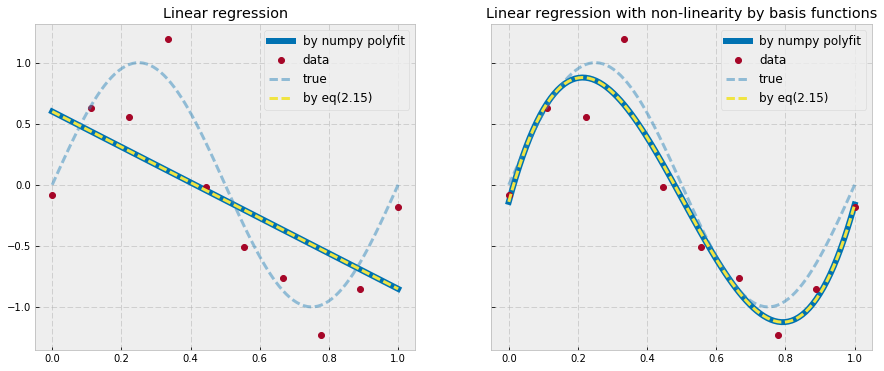

In [28]:
from numpy.linalg import inv # 역행렬 구해주는 선형 대수 함수

plt.rcParams["figure.figsize"] = (15,6)
f, (ax_lin, ax_nonlin) = plt.subplots(1, 2, sharex=True, sharey=True)

# 데이터 갯수
N = x_train.shape[0]

# w는 각 3차 계수, 2차 계수, 1차 계수, 0차 계수(상수)를 가지는 벡터
M = 4

#########################################################################
## 넘파이 라이브러리를 사용해서 간단하게 구할 수 있다.
#########################################################################
z_lin    = np.polyfit(x_train, t_train, 1) #1차로 근사할때 정말 선형회귀
z_nonlin = np.polyfit(x_train, t_train, M-1)

y_lin    = np.poly1d(z_lin)
y_nonlin = np.poly1d(z_nonlin)

ax_lin.plot(x, y_lin(x), linewidth=6, color=style_colors[9], label=r"by numpy polyfit")
ax_lin.plot(x_train, t_train, 'o', color=style_colors[1], label=r"data")

ax_nonlin.plot(x, y_nonlin(x), linewidth=6, color=style_colors[9], label=r"by numpy polyfit")
ax_nonlin.plot(x_train, t_train, 'o', color=style_colors[1], label=r"data")

#########################################################################
## 직접 수식으로 구현해 본다.
#########################################################################

#########################################################################
# DESIGN MATRIX 
# 기저함수를 쓰지 않는 경우 design matrix X, X에 1 추가 w벡터의 상수항 계수를 구하기 위해
# print(x_train.reshape(-1, 1))
# print(np.ones(N).reshape(-1,1))
# print(np.append(x_train.reshape(-1, 1), np.ones(N).reshape(-1,1), axis=1))
X = np.append(x_train.reshape(-1, 1), np.ones(N).reshape(-1,1), axis=1)

# 다항함수를 기반으로하는 design matrix Φ를 만든다.
# for c in (np.power(x_train.reshape(N,1), p) for p in range(M)) :
#    print(c)
PI = np.hstack( (np.power(x_train.reshape(-1,1), p) for p in range(M)) )
#########################################################################

#########################################################################
# SOLVE NORMAL EQ.  w = (Φ^T*Φ)^-1 * Φ^T * t (2.15)
# 기저함수를 쓰지 않는 경우는 디자인 행렬이 0행부터 고차수로 되어 있으므로 뒤집지 않아도 됨
# 아래처럼 수식과 똑같이 inverse해서 할 수 도 있고, linalg.solve()를 써서 선형 방정식을 풀 수 도 있다.
#w_lin = np.dot( inv(np.dot(X.T, X)) , np.dot(X.T , t_train.reshape(N,1)) ).reshape(-1)
w_lin = np.linalg.solve(np.dot(X.T, X), np.dot(X.T , t_train.reshape(N,1))).reshape(-1)

# 기저함수를 쓰는 경우는 구해지는 결과가 저차수->고차수순으로 계수가 정렬되어 있어 
# numpy결과와 비교하기 위해 뒤집어 주어야함. 그래야 poly1d 함수로 바른 다항식을 구성할 수 있음.
# 아래처럼 수식과 똑같이 inverse해서 할 수 도 있고, linalg.solve()를 써서 선형 방정식을 풀 수 도 있다.
# w_nonlin = np.dot( inv(np.dot(PI.T, PI)) , np.dot(PI.T , t_train.reshape(N,1)) ).reshape(-1)[::-1]
w_nonlin = np.linalg.solve(np.dot(PI.T, PI), np.dot(PI.T , t_train.reshape(N,1)) ).reshape(-1)[::-1]

# 다항식으로 구성한다.
y2_lin = np.poly1d(w_lin)
y2_nonlin = np.poly1d(w_nonlin)

#########################################################################
#  정보출력
print("Numpy polyfit")
print(y_lin)
print(y_nonlin)
print("\n")
print("RESULT BY EQ.(2.15)")
print(y2_lin)
print(y2_nonlin)

ax_lin.plot(x, t, '--', linewidth=3, color=style_colors[0], label=r"true",  alpha=0.5)
ax_lin.plot(x, y2_lin(x), '--', linewidth=3, color=style_colors[8], label=r"by eq(2.15)")
ax_lin.set_title("Linear regression")

ax_nonlin.plot(x, t, '--', linewidth=3, color=style_colors[0], label=r"true",  alpha=0.5)
ax_nonlin.plot(x, y2_nonlin(x), '--', linewidth=3, color=style_colors[8], label=r"by eq(2.15)")
ax_nonlin.set_title("Linear regression with non-linearity by basis functions")

legend = ax_lin.legend(loc='upper right', fontsize=12, shadow=False)
legend = ax_nonlin.legend(loc='upper right', fontsize=12, shadow=False)

plt.show()       

- <span class="code-body">numpy</span>의 내장 함수를 사용한것과 수식으로 직접 피팅한 결과 동일


#### 다양한 기저함수<sup>[nakamura]</sup>

- 기저함수를 $\sin(x)$, $\exp(x)$로 선택하고 아래와 같은 함수로 회귀시도

$$
g(x) = c_1 + c_2 x + c_3 \sin(x) + c_4 \exp(x)
$$

- 디자인 행렬

$$
\mathbf{\Phi} = \begin{bmatrix} 
\mid & \mid & \mid & \mid \\
\mathbf{1} & \boldsymbol{\mathsf{x}}  & \sin(\boldsymbol{\mathsf{x}} ) & \exp(\boldsymbol{\mathsf{x}} ) \\
\mid & \mid & \mid & \mid
\end{bmatrix}
$$



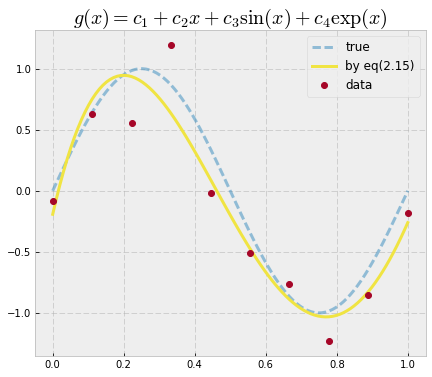

In [29]:
plt.rcParams["figure.figsize"] = (7,6)

# Numerical Analysis and Graphic Visualization with MATLAB 2nd ed. Shoichiro Nakamura, Prentice Hall

# Design Matrix
PI = np.c_[np.ones(x_train.shape[0]), x_train, np.sin(x_train), np.exp(x_train)]

# Solve normal eq.
W = np.linalg.solve( PI.T.dot(PI), PI.T.dot(t_train) )

y = W[0] + W[1]*x + W[2]*np.sin(x) + W[3]*np.exp(x)

plt.plot(x, t, '--', linewidth=3, color=style_colors[0], label=r"true",  alpha=0.5)
plt.plot(x, y, linewidth=3, color=style_colors[8], label=r"by eq(2.15)")
plt.plot(x_train, t_train, 'o', color=style_colors[1], label=r"data")
plt.legend(loc='upper right', fontsize=12, shadow=False)
plt.title(r"$g(x) = c_1 + c_2 x + c_3 \sin(x) + c_4 \exp(x)$", fontsize=20)
plt.show()

### L2 규제항이 있는 목적함수의 정규방정식  $\dagger$

#### 도함수

$$
\begin{align}
\frac{\partial \tilde{E}(\mathbf{w})}{\partial \mathbf{w}} &= \frac{\partial}{\partial \mathbf{w}} \left\{ \color{OrangeRed}{ \frac{1}{2} \sum_{n=1}^{N} \left\{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n)  \right\}^{2}} + \color{RoyalBlue}{\frac{\lambda}{2} \mathbf{w}^{\text{T}} \mathbf{w}} \right\} \\[5pt]
&= \frac{\partial}{\partial \mathbf{w}} \left\{ \color{OrangeRed}{ \frac{1}{2} \sum_{n=1}^{N} \left\{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n)  \right\}^{2}} \right\}  +  \frac{\partial}{\partial \mathbf{w}} \left\{ \color{RoyalBlue}{\frac{\lambda}{2} \mathbf{w}^{\text{T}} \mathbf{w}} \right\} \\[5pt]
&= \frac{1}{2} \sum_{n=1}^{N} \left[ 2 \left\{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n)  \right\} \left( \frac{\partial}{\partial \mathbf{w}} \left( t_n - \mathbf{w}^{\text{T}}\boldsymbol{\phi}(\mathbf{x}_n)  \right) \right) \right] + \frac{\lambda}{2} \cdot 2 \cdot \mathbf{w}^{\text{T}} \\[5pt]
&= \sum_{n=1}^{N} \left[ \left\{ t_n - \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n)  \right\} \left(  -\boldsymbol{\phi}(\mathbf{x}_n)^{\text{T}}  \right) \right] + \lambda \mathbf{w}^{\text{T}} \\[5pt]
&= \sum_{n=1}^{N} \left[  \mathbf{w}^{\text{T}} \boldsymbol{\phi}(\mathbf{x}_n)   \boldsymbol{\phi}(\mathbf{x}_n)^{\text{T}}  - t_n \boldsymbol{\phi}(\mathbf{x}_n)^{\text{T}} \right] + \lambda \mathbf{w}^{\text{T}} \\[5pt]
&= \mathbf{w}^{\text{T}} \sum_{n=1}^{N}  \left( \boldsymbol{\phi}(\mathbf{x}_n)   \boldsymbol{\phi}(\mathbf{x}_n)^{\text{T}} \right) + \lambda \mathbf{w}^{\text{T}}  - \sum_{n=1}^{N} t_n \boldsymbol{\phi}(\mathbf{x}_n)^{\text{T}} \\[5pt]
&= \mathbf{w}^{\text{T}}  \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} + \lambda \mathbf{w}^{\text{T}}  - \boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi} \\[5pt]
&= \mathbf{w}^{\text{T}} \left( \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} + \lambda \mathbf{I}_{M} \right) - \boldsymbol{\mathsf{t}}^{\text{T}} \mathbf{\Phi} \qquad \mathbf{I}_{M} : M \times M \text{  identity matrix}
\end{align} 
$$

#### 정규방정식

- 위 결과를 0으로 두고 정리하면

$$
\mathbf{w} = \left( \mathbf{\Phi}^{\text{T}} \mathbf{\Phi} + \color{RoyalBlue}{ \lambda \mathbf{I}_{M}} \right) ^{-1}\mathbf{\Phi}^{\text{T}} \boldsymbol{\mathsf{t}} \tag{2.16}
$$

Numpy polyfit
           9             8             7             6             5
5.464e+04 x - 2.627e+05 x + 5.329e+05 x - 5.917e+05 x + 3.902e+05 x
              4             3        2
 - 1.548e+05 x + 3.551e+04 x - 4236 x + 200.6 x - 0.08335


RESULT BY EQ.(2.16)
        9         8          7         6         5         4         3
-3.115 x - 2.495 x + 0.4006 x + 4.818 x + 8.038 x + 5.359 x - 5.891 x
          2
 - 14.85 x + 7.637 x - 0.07942


lambda : 0.0000453999


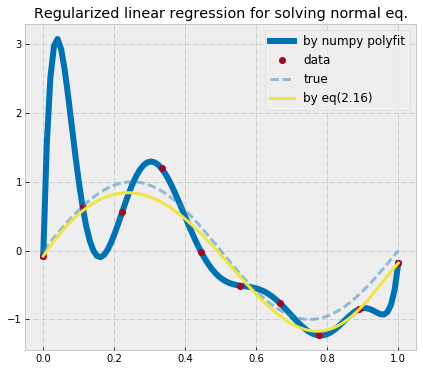

Error func. value : 0.232209


In [30]:
plt.rcParams["figure.figsize"] = (7,6)

# 데이터 갯수
N = x_train.shape[0]

# w는 각 3차 계수, 2차 계수, 1차 계수, 0차 계수(상수)를 가지는 벡터
M = 10
lamda = np.exp(-10)

#########################################################################
## 넘파이 라이브러리를 사용해서 간단하게 구할 수 있다.
#########################################################################
z_nonlin = np.polyfit(x_train, t_train, M-1)
y_nonlin = np.poly1d(z_nonlin)
plt.plot(x, y_nonlin(x), linewidth=6, color=style_colors[9], label=r"by numpy polyfit")
plt.plot(x_train, t_train, 'o', color=style_colors[1], label=r"data")

#########################################################################
## 직접 수식으로 구현해 본다.
#########################################################################

#########################################################################
# DESIGN MATRIX 
# 다항함수를 기반으로하는 design matrix Φ를 만든다.
# for c in (np.power(x_train.reshape(N,1), p) for p in range(M)) :
#    print(c)
PI = np.hstack( (np.power(x_train.reshape(N,1), p) for p in range(M)) )
#########################################################################

#########################################################################
# SOLVE NORMAL EQ.  w = (Φ^T*Φ)^-1 * Φ^T * t (2.15)
# 기저함수를 쓰는 경우는 구해지는 결과가 저차수->고차수순으로 계수가 정렬되어 있어 
# numpy결과와 비교하기 위해 뒤집어 주어야함. 그래야 poly1d 함수로 바른 다항식을 구성할 수 있음.
w_nonlin = np.linalg.solve(np.dot(PI.T, PI)+lamda*np.identity(M), 
                           np.dot(PI.T , t_train.reshape(N,1)) ).reshape(-1)[::-1]

# 다항식으로 구성한다.
y2_nonlin = np.poly1d(w_nonlin)

#########################################################################
#  정보출력
print("Numpy polyfit")
print(y_nonlin)
print("\n")
print("RESULT BY EQ.(2.16)")
print(y2_nonlin)
print("\n")
print("lambda : {:.10f}".format(lamda))

plt.plot(x, t, '--', linewidth=3, color=style_colors[0], label=r"true",  alpha=0.5)
plt.plot(x, y2_nonlin(x), linewidth=3, color=style_colors[8], label=r"by eq(2.16)")
plt.title("Regularized linear regression for solving normal eq.")

legend = plt.legend(loc='upper right', fontsize=12, shadow=False)

plt.show()       

X = np.array([ x_train**i for i in range(M) ])  
y = (w_nonlin[::-1].reshape(-1,1) * X).sum(axis=0)
print("Error func. value : {:f}".format(
    0.5*(( (y - t_train)**2 ).sum()) + (lamda/2.) 
    * np.linalg.norm(w_nonlin[::-1])**2)
    )


## 참고문헌

1. [Bishop] Pattern Recognition and Machine Learning, Christopher Bishop, Springer

2. [Tibshirani] The Elements of Statistical Learning 2ed., Trevor Hastie, Robert Tibshirani, Jerome Friedman, Springer

3. [why-ridge] https://stats.stackexchange.com/questions/118712/why-does-ridge-estimate-become-better-than-ols-by-adding-a-constant-to-the-diago/119708#119708

4. [오일석] 기계학습, 오일석, 한빛미디어

5. [Geron] Hands-On Machine Learning(핸즈온 머신러닝), Aurelien Geron(박해선 역), O'Reilly(한빛미디어)

6. [subgradient-wiki] https://en.wikipedia.org/wiki/Subgradient_method

7. [monk] Machine Learning 동영상강의, mathematicalmonk, https://www.youtube.com/playlist?list=PLD0F06AA0D2E8FFBA 

8. [lay] Linear Algebra and Its Applications 5th ed., David C. Lay, Steven R. Lay, Judi J. McDonald, Pearson

9. [nakamura] Numerical Analysis and Graphic Visualization with MATLAB 2nd ed. Shoichiro Nakamura, Prentice Hall

In [2]:
%%html
<link href='https://fonts.googleapis.com/earlyaccess/notosanskr.css' rel='stylesheet' type='text/css'>
<!--https://github.com/kattergil/NotoSerifKR-Web/stargazers-->
<link href='https://cdn.rawgit.com/kattergil/NotoSerifKR-Web/5e08423b/stylesheet/NotoSerif-Web.css' rel='stylesheet' type='text/css'>
<!--https://github.com/Joungkyun/font-d2coding-->
<link href="http://cdn.jsdelivr.net/gh/joungkyun/font-d2coding/d2coding.css" rel="stylesheet" type="text/css">
<style>
    h1     { font-family: 'Noto Sans KR' !important; color:#348ABD !important;   }
    h2     { font-family: 'Noto Sans KR' !important; color:#467821 !important;   }
    h3, h4 { font-family: 'Noto Sans KR' !important; color:#A60628 !important;   }
    p:not(.navbar-text) { font-family: 'Noto Serif KR', 'Nanum Myeongjo'; font-size: 12pt; line-height: 200%;  text-indent: 10px; }
    li:not(.dropdown):not(.p-TabBar-tab):not(.p-MenuBar-item):not(.jp-DirListing-item):not(.p-CommandPalette-header):not(.p-CommandPalette-item):not(.jp-RunningSessions-item):not(.p-Menu-item)   
            { font-family: 'Noto Serif KR', 'Nanum Myeongjo'; font-size: 12pt; line-height: 200%; }
    table  { font-family: 'Noto Sans KR' !important;  font-size: 11pt !important; }           
    li > p  { text-indent: 0px; }
    li > ul { margin-top: 0px !important; }       
    sup { font-family: 'Noto Sans KR'; font-size: 9pt; } 
    code, pre  { font-family: D2Coding, 'D2 coding' !important; font-size: 12pt !important; line-height: 130% !important;}
    .code-body { font-family: D2Coding, 'D2 coding' !important; font-size: 12pt !important;}
    .ns        { font-family: 'Noto Sans KR'; font-size: 15pt;}
    .summary   {
                   font-family: 'Georgia'; font-size: 12pt; line-height: 200%; 
                   border-left:3px solid #FF0000; 
                   padding-left:20px; 
                   margin-top:10px;
                   margin-left:15px;
               }
    .green { color:#467821 !important; }
    .comment { font-family: 'Noto Sans KR'; font-size: 10pt; }
</style>